In [1]:
import numpy as np
import os, glob
import matplotlib.pyplot as plt
import mplhep as hep
plt.style.use([hep.style.ROOT, hep.style.firamath])
import pickle, glob
import matplotlib.colors as mcolors
from matplotlib.colors import LinearSegmentedColormap
channel_list = ["Tracks_pt", "Tracks_dZSig", "Tracks_d0Sig", "ECAL_energy",
"HBHE_energy", "Pix_1", "Pix_2", "Pix_3", "Pix_4", "Tib_1", "Tib_2",
"Tib_3", "Tib_4", "Tob_1", "Tob_2", "Tob_3", "Tob_4", "Tob_5",
"Tob_6", "Tid_1", "Tec_1", "Tec_2", "Tec_3"]


# Define the CMS color scheme
cms_colors = [
    (0.00, '#FFFFFF'),  # White
    (0.33, '#005EB8'),  # Blue
    (0.66, '#FFDD00'),  # Yellow
    (1.00, '#FF0000')   # red
]

# Create the CMS colormap
cms_cmap = LinearSegmentedColormap.from_list('CMS', cms_colors)

m0_scale    = 14
m0_min      = 3.6
m0_max      = 14
mtrue_bins = np.arange(m0_min, m0_max, .4)
mae_min  =0
mae_max  = 10.5
mae_bins = np.arange(mae_min, mae_max, .5)
mre_bins = np.arange(0, 1.05, .05)
mass_bins = np.arange(3600,14000,400)/1000.

out_dir='plots'
if not os.path.isdir(out_dir):
    os.makedirs(out_dir)
save = True

##------m1.2to14 -----------

In [2]:
local='/home/bbbam/mass_trainer_aToTauTau/INFERENCE_DATA/INFERENCE_5_channels_Tracks_pt_Tracks_dZSig_Tracks_d0Sig_ECAL_energy_HBHE_energy_aToTauTau_m3p6To14_pT30To180/'
rhFileList = '%s/*.pkl'%(local)
paths = glob.glob(rhFileList)
assert len(paths) > 0
print(f"{len(paths)} files found")

1 files found


In [4]:
epoch=1

data_file = paths[epoch-1]
infile = open(f"{data_file}", "rb")
data = pickle.load(infile)
print(f"loaded data file ------>  {data_file}")
infile.close()

m_true_ = data["m_true"]
m_pred_ = data["m_pred"]
mae_ = data["mae"]
mre_ = data["mre"]

loaded data file ------>  /home/bbbam/mass_trainer_aToTauTau/INFERENCE_DATA/INFERENCE_5_channels_Tracks_pt_Tracks_dZSig_Tracks_d0Sig_ECAL_energy_HBHE_energy_aToTauTau_m3p6To14_pT30To180/epoch10_val_pseudoscalar_mae1.7546_inference_data.pkl


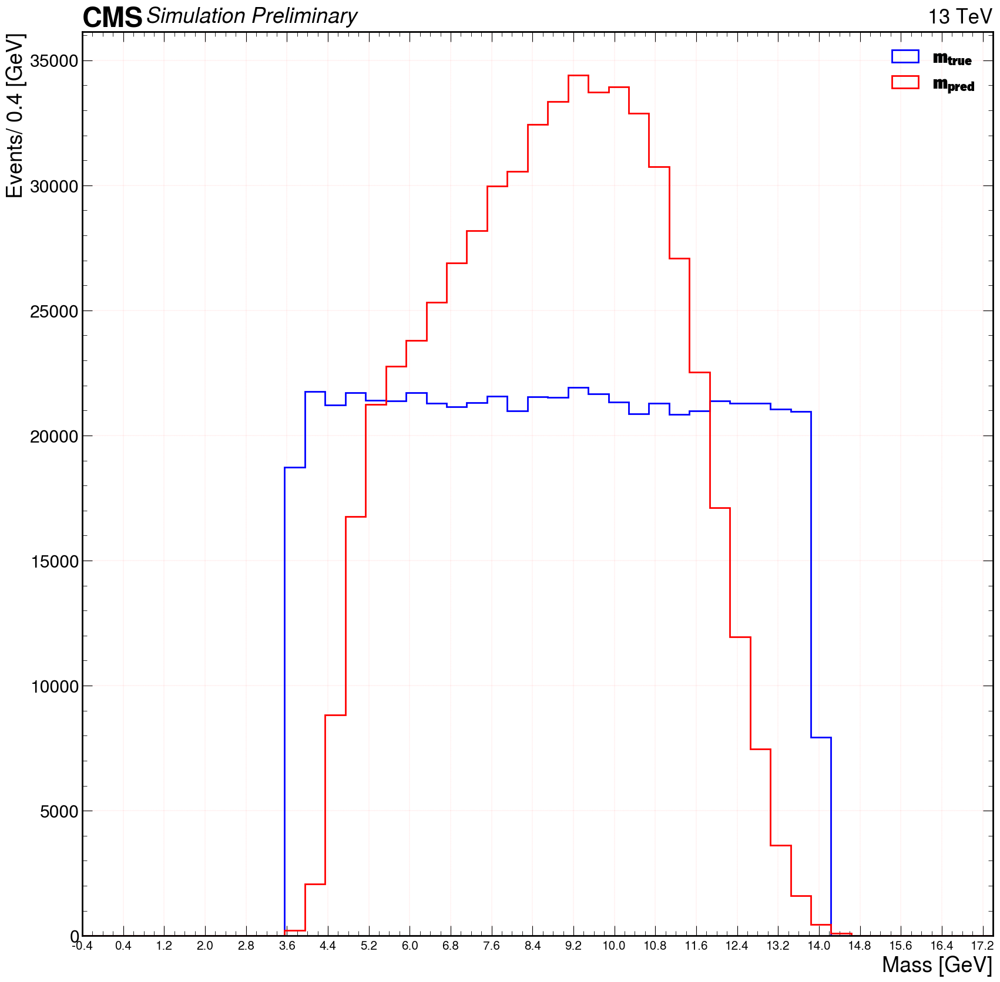

In [5]:
# Check 1D m_pred
# Extebded version
m0_min = 0.8
m0_max = 16.2
bin_size = 0.4
fig, ax = plt.subplots(figsize=(20,20))
plt.hist(m_true_, range=(m0_min-1.2,m0_max+1.2), bins=len(np.arange(m0_min-1.2,m0_max+1.2,bin_size)), histtype='step', label=r'$\mathrm{m_{true}}$', linestyle='-', color='blue', linewidth=2)
plt.hist(m_pred_, range=(m0_min-1.2,m0_max+1.2), bins=len(np.arange(m0_min-1.2,m0_max+1.2,bin_size)), histtype='step', label=r'$\mathrm{m_{pred}}$', linestyle='-', color='red', linewidth=2)
plt.xlim(m0_min-1.2,m0_max+1.2)
plt.xticks(np.arange(m0_min-1.2,m0_max+1.2,0.8),size=15)
plt.grid(color='r', linestyle='--', linewidth=.1)
plt.xlabel('Mass [GeV]')
plt.ylabel('Events/ 0.4 [GeV]')
# plt.title(r'$\mathrm{m_{true}}$, $\mathrm{m_{pred}}$ masses',size=25)
plt.legend(loc='upper right')
hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtru_mpred_hist_full.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()

# # Truncated version
# fig, ax = plt.subplots(figsize=(20,20))
# plt.hist(m_true_, range=(m0_min-bin_size,m0_max+bin_size), bins=len(np.arange(m0_min-0.4,m0_max+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{true}}$', linestyle='-', color='blue', linewidth=2)
# plt.hist(m_pred_, range=(m0_min-bin_size,m0_max+bin_size), bins=len(np.arange(m0_min-0.4,m0_max+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{pred}}$', linestyle='-', color='red', linewidth=2)
# plt.xlim(m0_min-bin_size,m0_max+bin_size)
# plt.xticks(np.arange(m0_min,m0_max+bin_size,bin_size),size=15)
# plt.grid(color='r', linestyle='--', linewidth=.1)
# plt.xlabel('Mass [GeV]')
# plt.ylabel('Events/ 0.4 [GeV]' )
# # plt.title(r'$\mathrm{m_{true}}$, $\mathrm{m_{pred}}$ masses', size=25)
# plt.legend(loc='upper right')
# hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# # plt.savefig('%s/%d_mtru_mpred_hist_truncate.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
# plt.show()

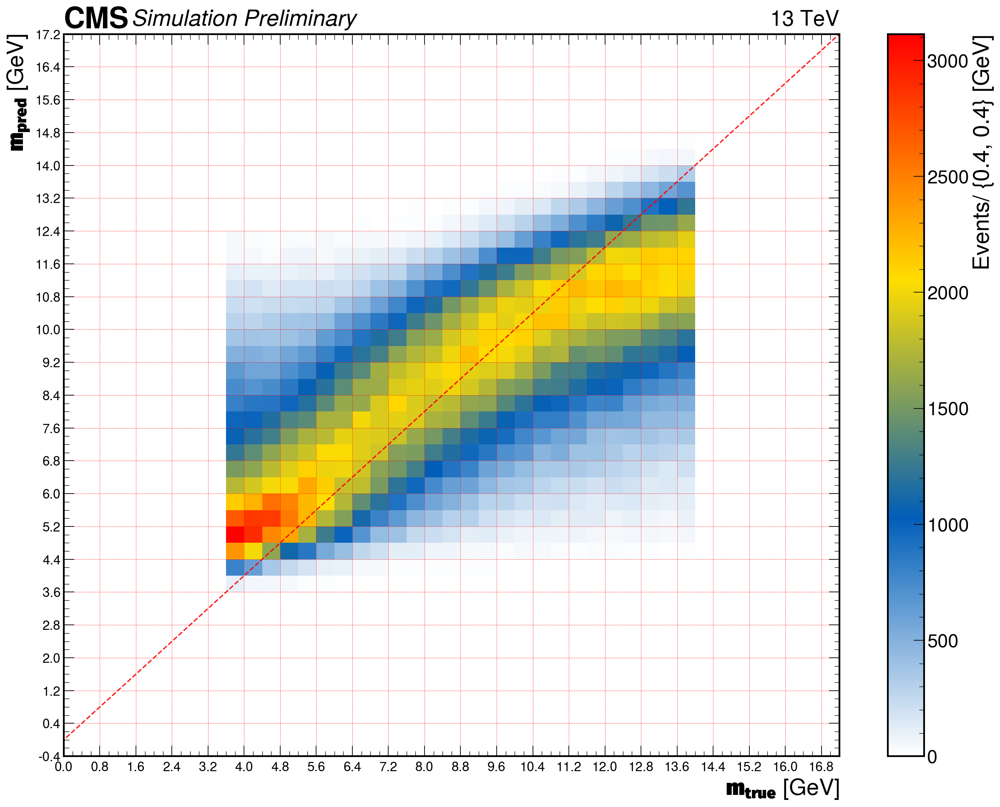

In [6]:
# 2D hist mteru and mpred
# Extended version
fig, ax = plt.subplots(figsize=(20,15), dpi=150)
plt.hist2d(np.squeeze(m_true_), np.squeeze(m_pred_), bins=[np.arange(m0_min-0.8, m0_max+1.2, .4), np.arange(m0_min-1.2, m0_max+1.2, .4)],cmap=cms_cmap)
plt.xlabel(r'$\mathrm{m_{true}}$ [GeV]')
plt.ylabel(r'$\mathrm{m_{pred}}$ [GeV]')
plt.plot((m0_min-1.2, m0_max+1.2), (m0_min-1.2, m0_max+1.2), color='r', linestyle='--', alpha=0.9)
plt.xticks(np.arange(m0_min-0.8, m0_max+1.2, .8),size=15)
plt.yticks(np.arange(m0_min-1.2, m0_max+1.2, .8),size=15)
plt.colorbar().set_label(label='Events/ {0.4, 0.4} [GeV]' )
plt.grid(color='r', linestyle='--', linewidth=.4)
hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtrue_mpred_2D_hist_full.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()

# # Truncated version
# fig, ax = plt.subplots(figsize=(20,15))
# hist = plt.hist2d(np.squeeze(m_true_), np.squeeze(m_pred_), bins=[np.arange(3.6, 14.1, .4), np.arange(3.6, 14.1, .4)],cmap=cms_cmap)
# plt.xlabel(r'$\mathrm{m_{label}}$ [GeV]')
# plt.ylabel(r'$\mathrm{m_{pred}}$ [GeV]')
# plt.plot((m0_min, m0_max), (m0_min, m0_max), color='r', linestyle='--', alpha=0.9)
# plt.xticks(np.arange(3.6, 14.1, .8),size=15)
# plt.yticks(np.arange(3.6, 14.1, .8),size=15)
# plt.colorbar().set_label(label='Events/ {0.4, 0.4} [GeV]')
# plt.grid(color='r', linestyle='--', linewidth=.5)

# hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# # plt.savefig('%s/%d_mtrue_mpred_2D_hist_truncated.png'%(out_dir, epoch),  bbox_inches='tight', dpi=300, facecolor = "w")
# plt.show()

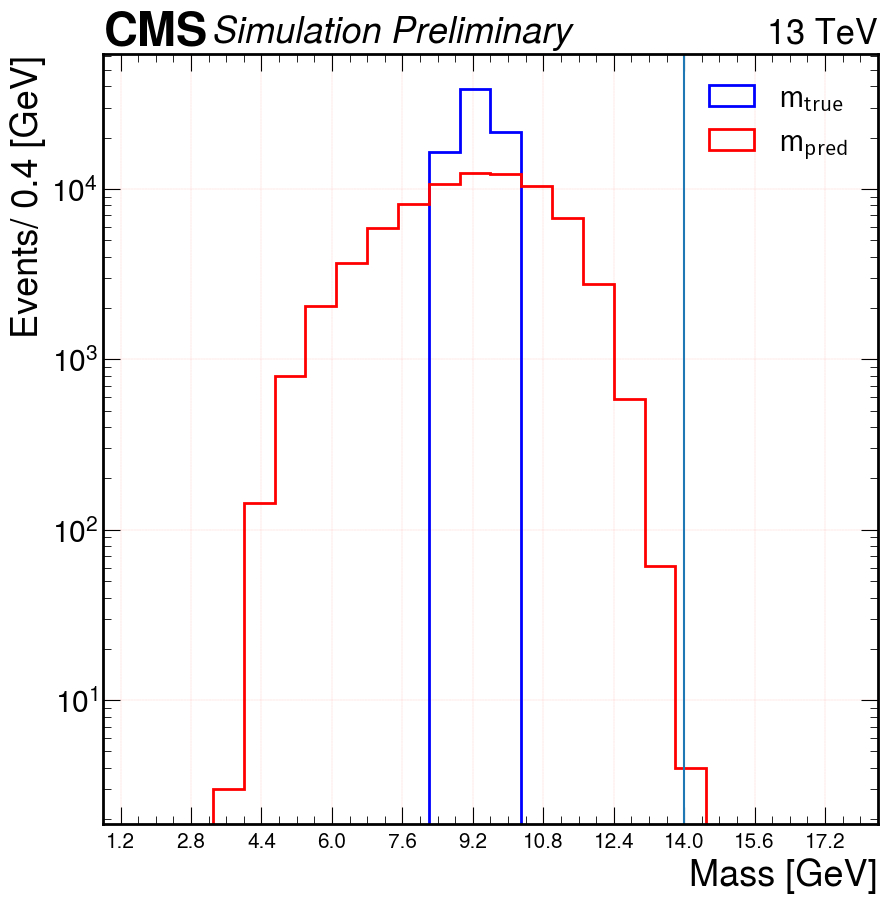

In [39]:
m_true, m_pred = [], []
for i in range(len(m_true_)):
    if m_true_[i]<8.6 or m_true_[i] >10 :continue
    m_true.append(m_true_[i])
    m_pred.append(m_pred_[i])
    
bin_size=.4
fig, ax = plt.subplots(figsize=(10,10))
plt.hist(np.squeeze(m_true), range=(1.2,18), bins=len(np.arange(9,18+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{true}}$', linestyle='-', color='blue', linewidth=2,log=1)
plt.hist(np.squeeze(m_pred), range=(1.2,18), bins=len(np.arange(9,18+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{pred}}$', linestyle='-', color='red', linewidth=2,log=1)
plt.xlim(1.2-bin_size,18+bin_size)
plt.xticks(np.arange(1.2,18+bin_size,1.6),size=15)
plt.grid(color='r', linestyle='--', linewidth=.1)
plt.xlabel('Mass [GeV]')
plt.ylabel('Events/ 0.4 [GeV]' )
plt.axvline(x=14)
# plt.title(r'$\mathrm{m_{true}}$, $\mathrm{m_{pred}}$ masses', size=25)
plt.legend(loc='upper right')
hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtru_mpred_hist_truncate.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()    
        

##------m1.2to17.2 with less in unphy and original upper limit

In [2]:
local='/home/bbbam/mass_trainer_aToTauTau_m1p2To17p2_less_unphysical/INFERENCE_DATA/5_channels_Tracks_pt_Tracks_dZSig_Tracks_d0Sig_ECAL_energy_HBHE_energy_aToTauTau_pT30To180_with_mass1p2To17p2_less_low_PTscale0.02_ECALscale0_HCALscale1_AOD_m0o14.0_ResNet_blocks3_mae_loss_epochs20_BatchSize1024_from0_ntrain6571008_nval560128_run0/'
rhFileList = '%s/*.pkl'%(local)
paths = glob.glob(rhFileList)
assert len(paths) > 0
print(f"{len(paths)} files found")

11 files found


In [3]:
epoch=11

data_file = paths[epoch-1]
infile = open(f"{data_file}", "rb")
data = pickle.load(infile)
print(f"loaded data file ------>  {data_file}")
infile.close()

m_true_ = data["m_true"]
m_pred_ = data["m_pred"]
mae_ = data["mae"]
mre_ = data["mre"]

loaded data file ------>  /home/bbbam/mass_trainer_aToTauTau_m1p2To17p2_less_unphysical/INFERENCE_DATA/5_channels_Tracks_pt_Tracks_dZSig_Tracks_d0Sig_ECAL_energy_HBHE_energy_aToTauTau_pT30To180_with_mass1p2To17p2_less_low_PTscale0.02_ECALscale0_HCALscale1_AOD_m0o14.0_ResNet_blocks3_mae_loss_epochs20_BatchSize1024_from0_ntrain6571008_nval560128_run0/epoch11_val_pseudoscalar_mae1.8328_inference_data.pkl


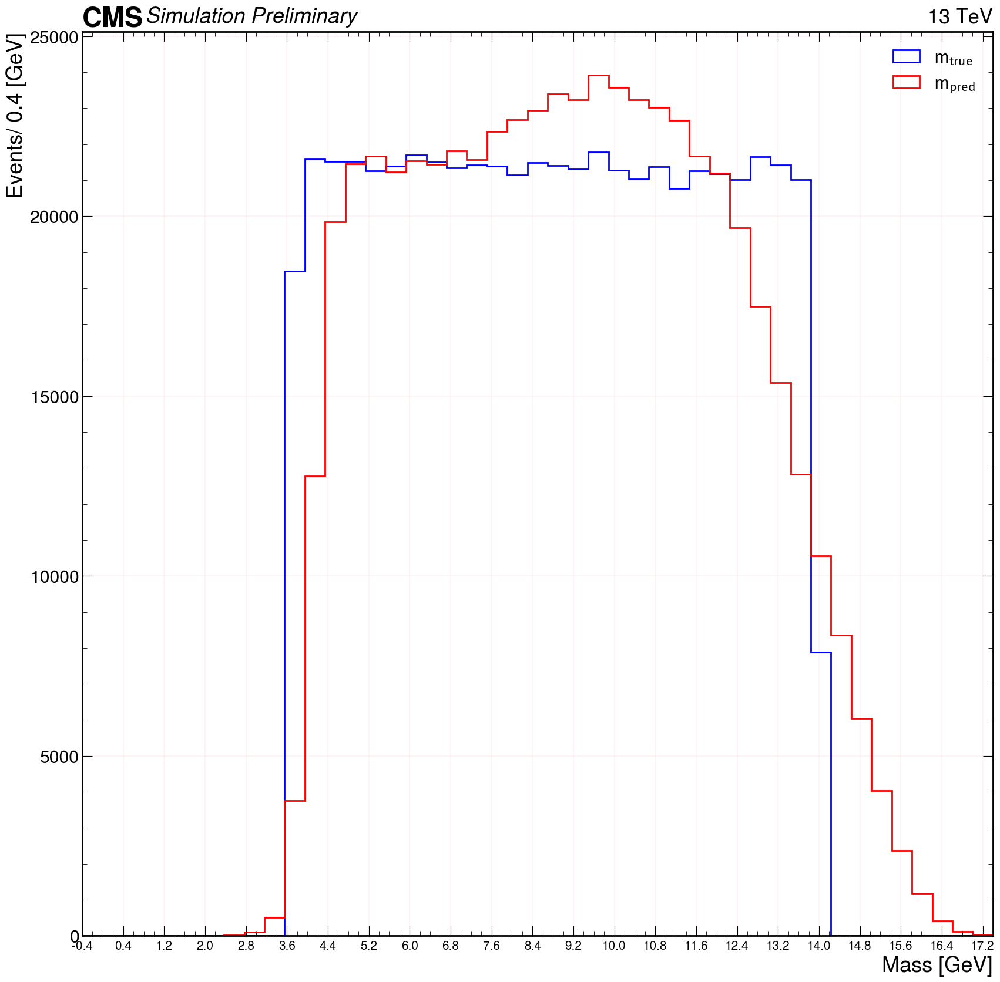

In [4]:
# Check 1D m_pred
# Extebded version
m0_min = 0.8
m0_max = 16.2
bin_size = 0.4
fig, ax = plt.subplots(figsize=(20,20))
plt.hist(m_true_, range=(m0_min-1.2,m0_max+1.2), bins=len(np.arange(m0_min-1.2,m0_max+1.2,bin_size)), histtype='step', label=r'$\mathrm{m_{true}}$', linestyle='-', color='blue', linewidth=2)
plt.hist(m_pred_, range=(m0_min-1.2,m0_max+1.2), bins=len(np.arange(m0_min-1.2,m0_max+1.2,bin_size)), histtype='step', label=r'$\mathrm{m_{pred}}$', linestyle='-', color='red', linewidth=2)
plt.xlim(m0_min-1.2,m0_max+1.2)
plt.xticks(np.arange(m0_min-1.2,m0_max+1.2,0.8),size=15)
plt.grid(color='r', linestyle='--', linewidth=.1)
plt.xlabel('Mass [GeV]')
plt.ylabel('Events/ 0.4 [GeV]')
# plt.title(r'$\mathrm{m_{true}}$, $\mathrm{m_{pred}}$ masses',size=25)
plt.legend(loc='upper right')
hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtru_mpred_hist_full.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()

# # Truncated version
# fig, ax = plt.subplots(figsize=(20,20))
# plt.hist(m_true_, range=(m0_min-bin_size,m0_max+bin_size), bins=len(np.arange(m0_min-0.4,m0_max+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{true}}$', linestyle='-', color='blue', linewidth=2)
# plt.hist(m_pred_, range=(m0_min-bin_size,m0_max+bin_size), bins=len(np.arange(m0_min-0.4,m0_max+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{pred}}$', linestyle='-', color='red', linewidth=2)
# plt.xlim(m0_min-bin_size,m0_max+bin_size)
# plt.xticks(np.arange(m0_min,m0_max+bin_size,bin_size),size=15)
# plt.grid(color='r', linestyle='--', linewidth=.1)
# plt.xlabel('Mass [GeV]')
# plt.ylabel('Events/ 0.4 [GeV]' )
# # plt.title(r'$\mathrm{m_{true}}$, $\mathrm{m_{pred}}$ masses', size=25)
# plt.legend(loc='upper right')
# hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# # plt.savefig('%s/%d_mtru_mpred_hist_truncate.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
# plt.show()

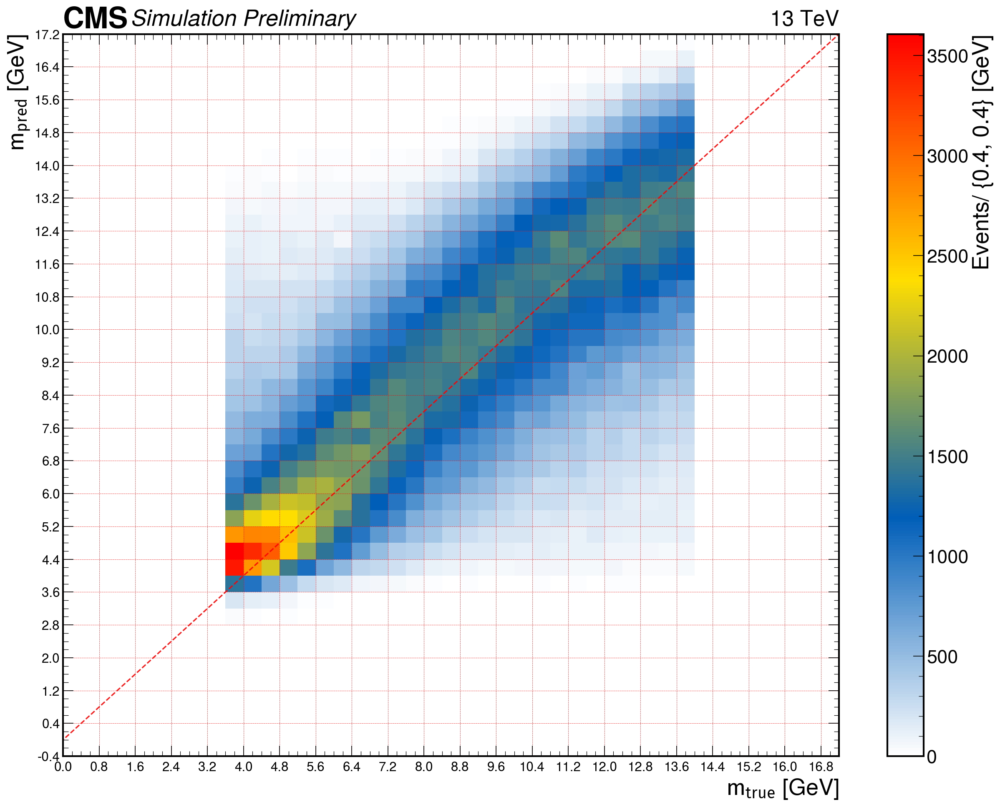

In [5]:
# 2D hist mteru and mpred
# Extended version
fig, ax = plt.subplots(figsize=(20,15), dpi=150)
plt.hist2d(np.squeeze(m_true_), np.squeeze(m_pred_), bins=[np.arange(m0_min-0.8, m0_max+1.2, .4), np.arange(m0_min-1.2, m0_max+1.2, .4)],cmap=cms_cmap)
plt.xlabel(r'$\mathrm{m_{true}}$ [GeV]')
plt.ylabel(r'$\mathrm{m_{pred}}$ [GeV]')
plt.plot((m0_min-1.2, m0_max+1.2), (m0_min-1.2, m0_max+1.2), color='r', linestyle='--', alpha=0.9)
plt.xticks(np.arange(m0_min-0.8, m0_max+1.2, .8),size=15)
plt.yticks(np.arange(m0_min-1.2, m0_max+1.2, .8),size=15)
plt.colorbar().set_label(label='Events/ {0.4, 0.4} [GeV]' )
plt.grid(color='r', linestyle='--', linewidth=.4)
hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtrue_mpred_2D_hist_full.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()

# # Truncated version
# fig, ax = plt.subplots(figsize=(20,15))
# hist = plt.hist2d(np.squeeze(m_true_), np.squeeze(m_pred_), bins=[np.arange(3.6, 14.1, .4), np.arange(3.6, 14.1, .4)],cmap=cms_cmap)
# plt.xlabel(r'$\mathrm{m_{label}}$ [GeV]')
# plt.ylabel(r'$\mathrm{m_{pred}}$ [GeV]')
# plt.plot((m0_min, m0_max), (m0_min, m0_max), color='r', linestyle='--', alpha=0.9)
# plt.xticks(np.arange(3.6, 14.1, .8),size=15)
# plt.yticks(np.arange(3.6, 14.1, .8),size=15)
# plt.colorbar().set_label(label='Events/ {0.4, 0.4} [GeV]')
# plt.grid(color='r', linestyle='--', linewidth=.5)

# hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# # plt.savefig('%s/%d_mtrue_mpred_2D_hist_truncated.png'%(out_dir, epoch),  bbox_inches='tight', dpi=300, facecolor = "w")
# plt.show()

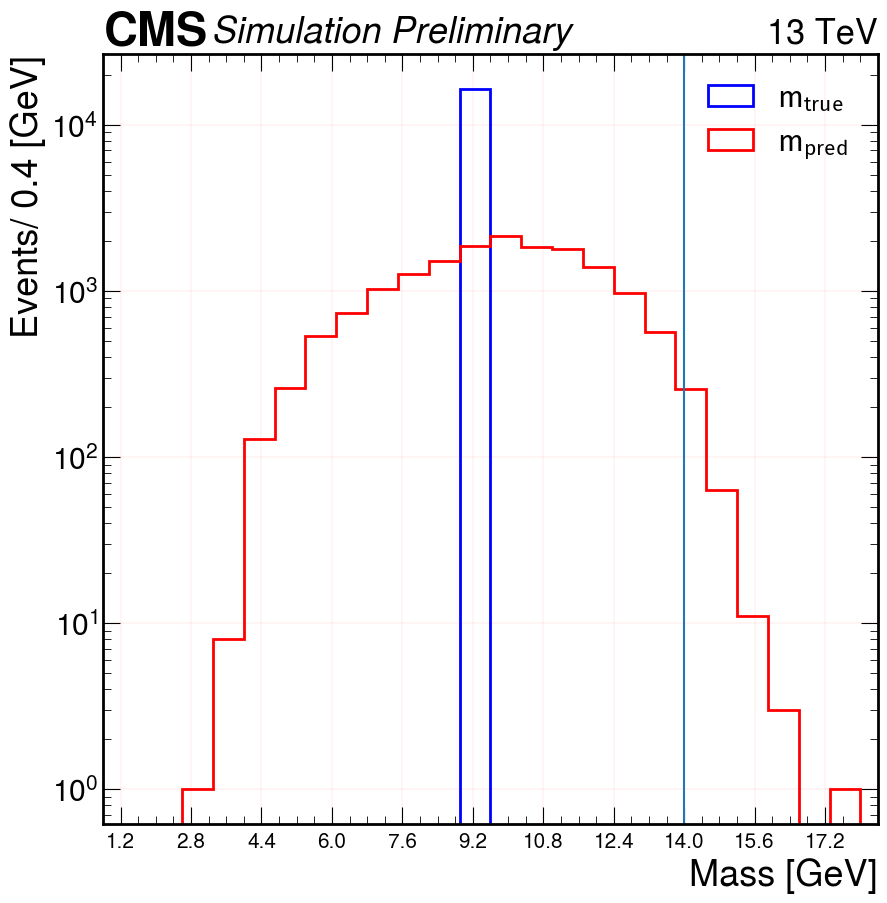

In [6]:
m_true, m_pred = [], []
for i in range(len(m_true_)):
    if m_true_[i]<9.3 or m_true_[i] >9.6 :continue
    m_true.append(m_true_[i])
    m_pred.append(m_pred_[i])
    
bin_size=.4
fig, ax = plt.subplots(figsize=(10,10))
plt.hist(np.squeeze(m_true), range=(1.2,18), bins=len(np.arange(9,18+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{true}}$', linestyle='-', color='blue', linewidth=2,log=1)
plt.hist(np.squeeze(m_pred), range=(1.2,18), bins=len(np.arange(9,18+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{pred}}$', linestyle='-', color='red', linewidth=2,log=1)
plt.xlim(1.2-bin_size,18+bin_size)
plt.xticks(np.arange(1.2,18+bin_size,1.6),size=15)
plt.grid(color='r', linestyle='--', linewidth=.1)
plt.xlabel('Mass [GeV]')
plt.ylabel('Events/ 0.4 [GeV]' )
plt.axvline(x=14)
# plt.title(r'$\mathrm{m_{true}}$, $\mathrm{m_{pred}}$ masses', size=25)
plt.legend(loc='upper right')
hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtru_mpred_hist_truncate.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()    
        

In [ ]:
##_------------------------------m1.2to17.2_full_low_more_high

In [7]:
local='/home/bbbam/mass_trainer_aToTauTau_m1p2To17p2_all_unpy_more_upper/INFERENCE_DATA/5_channels_pT30To180_with_mass1p2To17p2_all_low_more_high_PTscale0.02_ECALscale0_HCALscale1_AOD_m0o14.0_ResNet_blocks3_mae_loss_epochs20_BatchSize1024_from0_ntrain7789568_nval560128_run0/'
rhFileList = '%s/*.pkl'%(local)
paths = glob.glob(rhFileList)
assert len(paths) > 0
print(f"{len(paths)} files found")

2 files found


In [13]:
epoch=2

data_file = paths[epoch-1]
infile = open(f"{data_file}", "rb")
data = pickle.load(infile)
print(f"loaded data file ------>  {data_file}")
infile.close()

m_true_ = data["m_true"]
m_pred_ = data["m_pred"]
mae_ = data["mae"]
mre_ = data["mre"]

loaded data file ------>  /home/bbbam/mass_trainer_aToTauTau_m1p2To17p2_all_unpy_more_upper/INFERENCE_DATA/5_channels_pT30To180_with_mass1p2To17p2_all_low_more_high_PTscale0.02_ECALscale0_HCALscale1_AOD_m0o14.0_ResNet_blocks3_mae_loss_epochs20_BatchSize1024_from0_ntrain7789568_nval560128_run0/epoch2_val_pseudoscalar_mae2.0950_inference_data.pkl


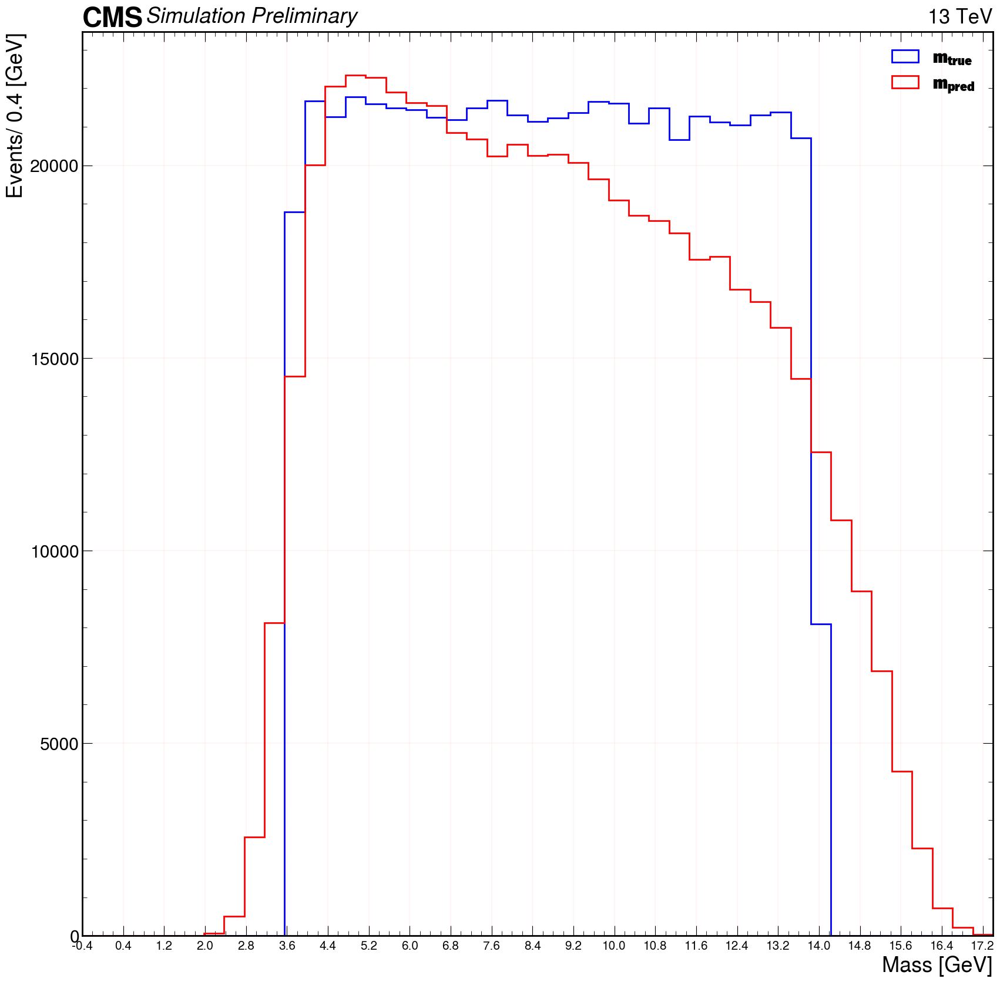

In [13]:
# Check 1D m_pred
# Extebded version
m0_min = 0.8
m0_max = 16.2
bin_size = 0.4
fig, ax = plt.subplots(figsize=(20,20))
plt.hist(m_true_, range=(m0_min-1.2,m0_max+1.2), bins=len(np.arange(m0_min-1.2,m0_max+1.2,bin_size)), histtype='step', label=r'$\mathrm{m_{true}}$', linestyle='-', color='blue', linewidth=2)
plt.hist(m_pred_, range=(m0_min-1.2,m0_max+1.2), bins=len(np.arange(m0_min-1.2,m0_max+1.2,bin_size)), histtype='step', label=r'$\mathrm{m_{pred}}$', linestyle='-', color='red', linewidth=2)
plt.xlim(m0_min-1.2,m0_max+1.2)
plt.xticks(np.arange(m0_min-1.2,m0_max+1.2,0.8),size=15)
plt.grid(color='r', linestyle='--', linewidth=.1)
plt.xlabel('Mass [GeV]')
plt.ylabel('Events/ 0.4 [GeV]')
# plt.title(r'$\mathrm{m_{true}}$, $\mathrm{m_{pred}}$ masses',size=25)
plt.legend(loc='upper right')
hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtru_mpred_hist_full.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()

# # Truncated version
# fig, ax = plt.subplots(figsize=(20,20))
# plt.hist(m_true_, range=(m0_min-bin_size,m0_max+bin_size), bins=len(np.arange(m0_min-0.4,m0_max+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{true}}$', linestyle='-', color='blue', linewidth=2)
# plt.hist(m_pred_, range=(m0_min-bin_size,m0_max+bin_size), bins=len(np.arange(m0_min-0.4,m0_max+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{pred}}$', linestyle='-', color='red', linewidth=2)
# plt.xlim(m0_min-bin_size,m0_max+bin_size)
# plt.xticks(np.arange(m0_min,m0_max+bin_size,bin_size),size=15)
# plt.grid(color='r', linestyle='--', linewidth=.1)
# plt.xlabel('Mass [GeV]')
# plt.ylabel('Events/ 0.4 [GeV]' )
# # plt.title(r'$\mathrm{m_{true}}$, $\mathrm{m_{pred}}$ masses', size=25)
# plt.legend(loc='upper right')
# hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# # plt.savefig('%s/%d_mtru_mpred_hist_truncate.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
# plt.show()

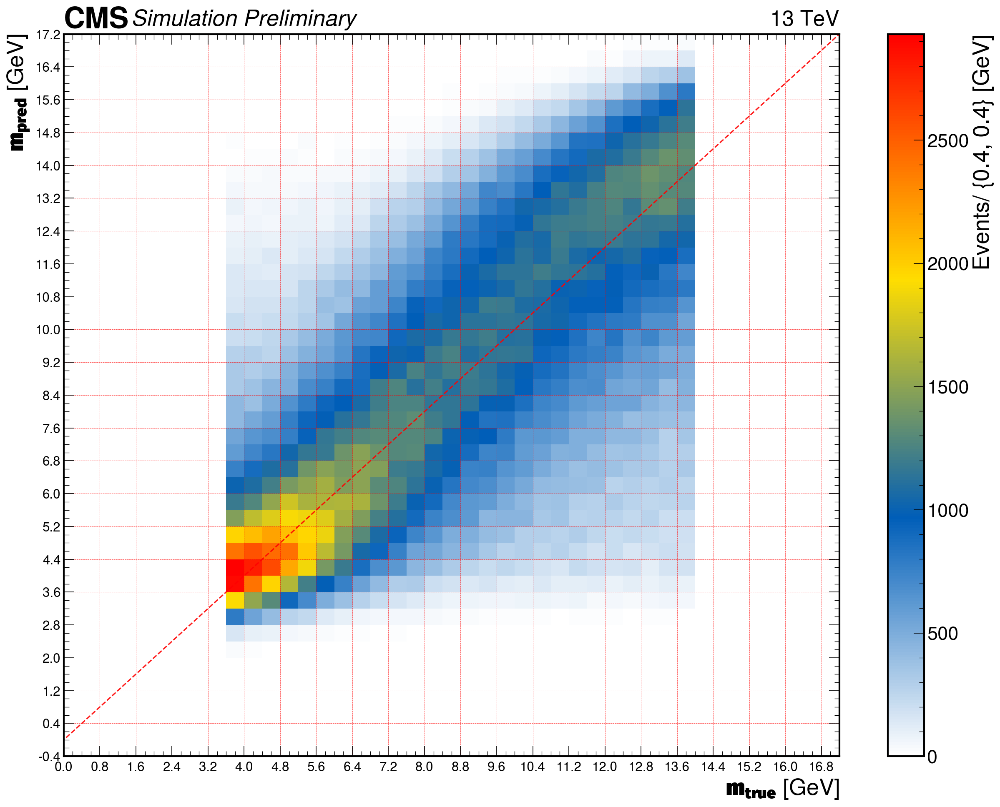

In [14]:
# 2D hist mteru and mpred
# Extended version
fig, ax = plt.subplots(figsize=(20,15), dpi=150)
plt.hist2d(np.squeeze(m_true_), np.squeeze(m_pred_), bins=[np.arange(m0_min-0.8, m0_max+1.2, .4), np.arange(m0_min-1.2, m0_max+1.2, .4)],cmap=cms_cmap)
plt.xlabel(r'$\mathrm{m_{true}}$ [GeV]')
plt.ylabel(r'$\mathrm{m_{pred}}$ [GeV]')
plt.plot((m0_min-1.2, m0_max+1.2), (m0_min-1.2, m0_max+1.2), color='r', linestyle='--', alpha=0.9)
plt.xticks(np.arange(m0_min-0.8, m0_max+1.2, .8),size=15)
plt.yticks(np.arange(m0_min-1.2, m0_max+1.2, .8),size=15)
plt.colorbar().set_label(label='Events/ {0.4, 0.4} [GeV]' )
plt.grid(color='r', linestyle='--', linewidth=.4)
hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtrue_mpred_2D_hist_full.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()

# # Truncated version
# fig, ax = plt.subplots(figsize=(20,15))
# hist = plt.hist2d(np.squeeze(m_true_), np.squeeze(m_pred_), bins=[np.arange(3.6, 14.1, .4), np.arange(3.6, 14.1, .4)],cmap=cms_cmap)
# plt.xlabel(r'$\mathrm{m_{label}}$ [GeV]')
# plt.ylabel(r'$\mathrm{m_{pred}}$ [GeV]')
# plt.plot((m0_min, m0_max), (m0_min, m0_max), color='r', linestyle='--', alpha=0.9)
# plt.xticks(np.arange(3.6, 14.1, .8),size=15)
# plt.yticks(np.arange(3.6, 14.1, .8),size=15)
# plt.colorbar().set_label(label='Events/ {0.4, 0.4} [GeV]')
# plt.grid(color='r', linestyle='--', linewidth=.5)

# hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# # plt.savefig('%s/%d_mtrue_mpred_2D_hist_truncated.png'%(out_dir, epoch),  bbox_inches='tight', dpi=300, facecolor = "w")
# plt.show()

In [14]:
###----------------m1To17p2_less_unphysical_more_upper_over_populated--------------------------------------------

In [8]:
local='/home/bbbam/mass_trainer_aToTauTau_m1p2To17p2_less_unpy_more_upper/INFERENCE_DATA/5_channels_pT30To180_with_mass1p2To17p2_less_low_more_high_PTscale0.02_ECALscale0_HCALscale1_AOD_m0o14.0_ResNet_blocks3_mae_loss_epochs20_BatchSize1024_from0_ntrain7198720_nval560128_run0/'
rhFileList = '%s/*.pkl'%(local)
paths = glob.glob(rhFileList)
assert len(paths) > 0
print(f"{len(paths)} files found")

10 files found


In [10]:
epoch=10

data_file = paths[epoch-1]
infile = open(f"{data_file}", "rb")
data = pickle.load(infile)
print(f"loaded data file ------>  {data_file}")
infile.close()

m_true_ = data["m_true"]
m_pred_ = data["m_pred"]
mae_ = data["mae"]
mre_ = data["mre"]

loaded data file ------>  /home/bbbam/mass_trainer_aToTauTau_m1p2To17p2_less_unpy_more_upper/INFERENCE_DATA/5_channels_pT30To180_with_mass1p2To17p2_less_low_more_high_PTscale0.02_ECALscale0_HCALscale1_AOD_m0o14.0_ResNet_blocks3_mae_loss_epochs20_BatchSize1024_from0_ntrain7198720_nval560128_run0/epoch10_val_pseudoscalar_mae1.9031_inference_data.pkl


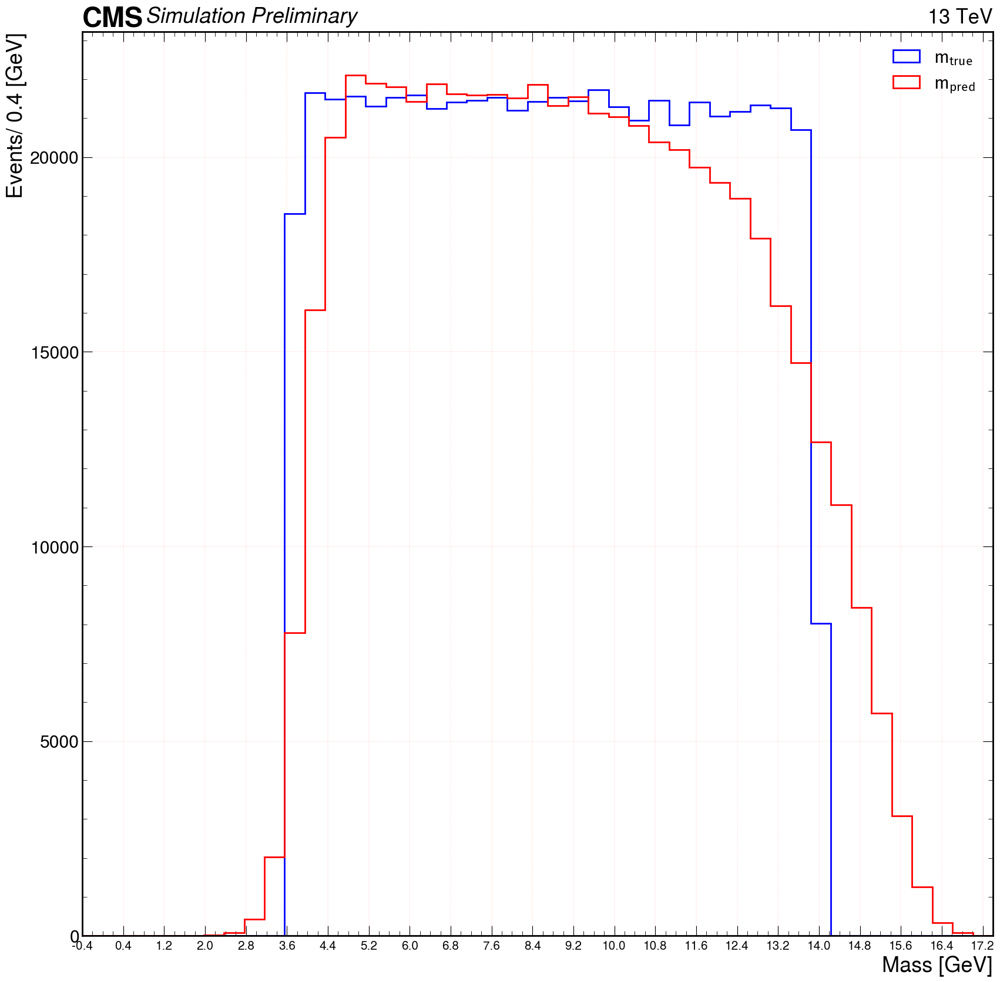

In [17]:
# Check 1D m_pred
# Extebded version
m0_min = 0.8
m0_max = 16.2
bin_size = 0.4
fig, ax = plt.subplots(figsize=(20,20))
plt.hist(m_true_, range=(m0_min-1.2,m0_max+1.2), bins=len(np.arange(m0_min-1.2,m0_max+1.2,bin_size)), histtype='step', label=r'$\mathrm{m_{true}}$', linestyle='-', color='blue', linewidth=2)
plt.hist(m_pred_, range=(m0_min-1.2,m0_max+1.2), bins=len(np.arange(m0_min-1.2,m0_max+1.2,bin_size)), histtype='step', label=r'$\mathrm{m_{pred}}$', linestyle='-', color='red', linewidth=2)
plt.xlim(m0_min-1.2,m0_max+1.2)
plt.xticks(np.arange(m0_min-1.2,m0_max+1.2,.8),size=15)
plt.grid(color='r', linestyle='--', linewidth=.1)
plt.xlabel('Mass [GeV]')
plt.ylabel('Events/ 0.4 [GeV]')
# plt.title(r'$\mathrm{m_{true}}$, $\mathrm{m_{pred}}$ masses',size=25)
plt.legend(loc='upper right')
hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtru_mpred_hist_full.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()

# # Truncated version
# fig, ax = plt.subplots(figsize=(20,20))
# plt.hist(m_true_, range=(m0_min-bin_size,m0_max+bin_size), bins=len(np.arange(m0_min-0.4,m0_max+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{true}}$', linestyle='-', color='blue', linewidth=2)
# plt.hist(m_pred_, range=(m0_min-bin_size,m0_max+bin_size), bins=len(np.arange(m0_min-0.4,m0_max+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{pred}}$', linestyle='-', color='red', linewidth=2)
# plt.xlim(m0_min-bin_size,m0_max+bin_size)
# plt.xticks(np.arange(m0_min,m0_max+bin_size,bin_size),size=15)
# plt.grid(color='r', linestyle='--', linewidth=.1)
# plt.xlabel('Mass [GeV]')
# plt.ylabel('Events/ 0.4 [GeV]' )
# # plt.title(r'$\mathrm{m_{true}}$, $\mathrm{m_{pred}}$ masses', size=25)
# plt.legend(loc='upper right')
# hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# # plt.savefig('%s/%d_mtru_mpred_hist_truncate.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
# plt.show()

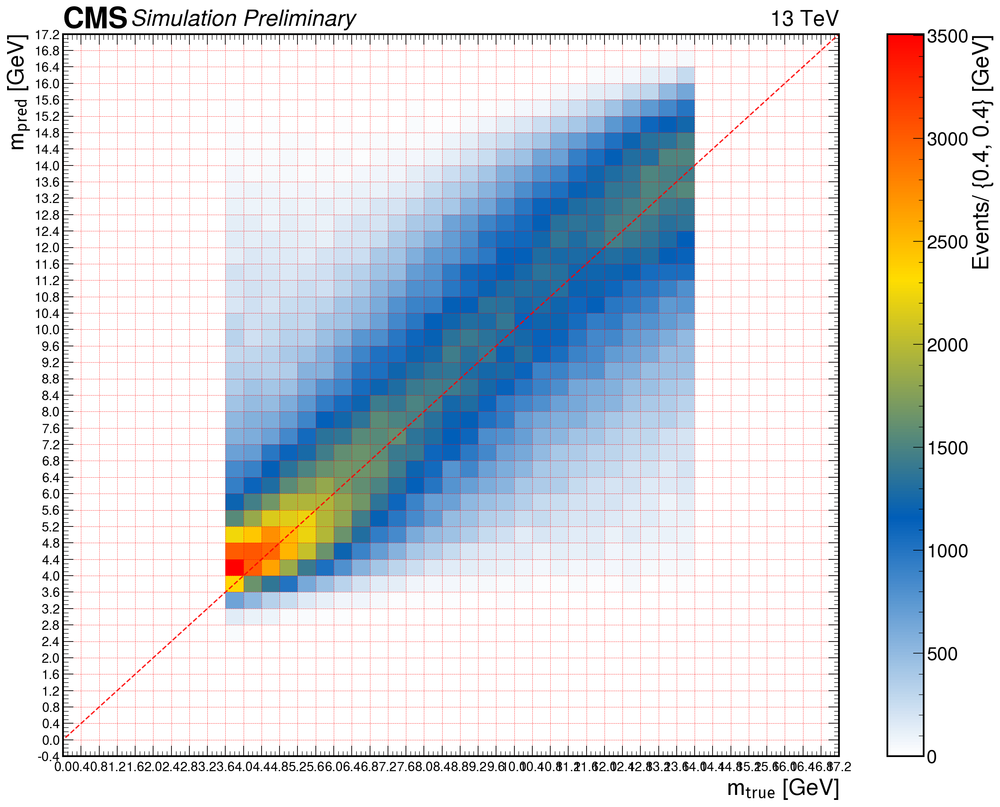

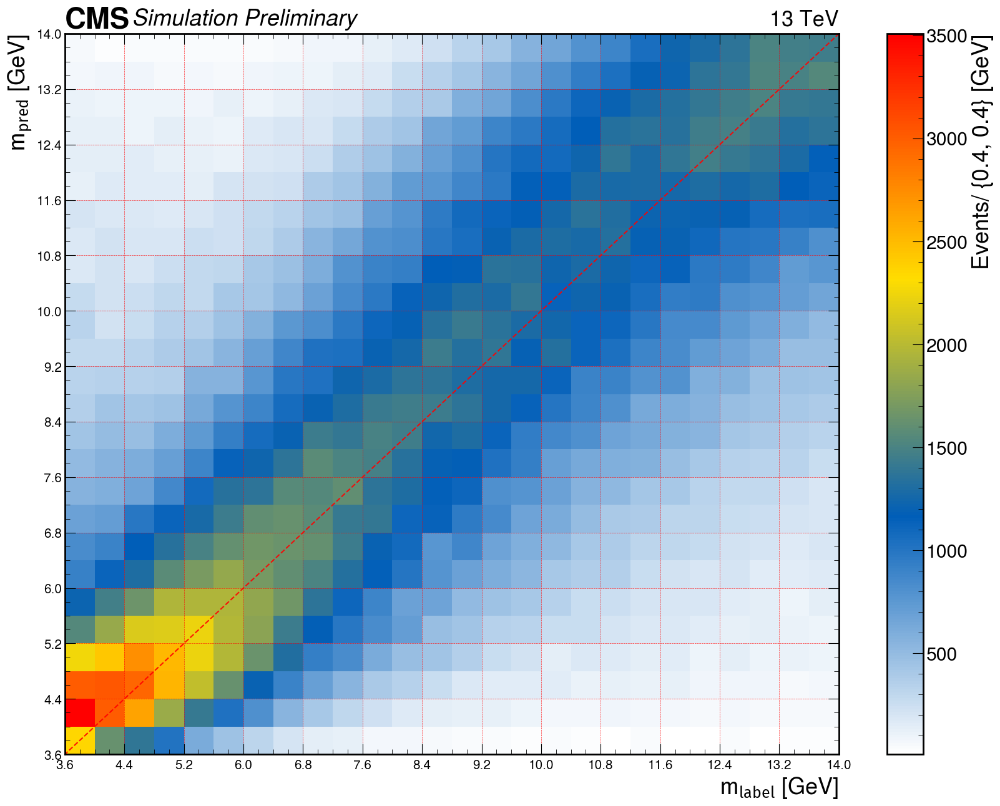

In [18]:
# 2D hist mteru and mpred
# Extended version
fig, ax = plt.subplots(figsize=(20,15), dpi=150)
plt.hist2d(np.squeeze(m_true_), np.squeeze(m_pred_), bins=[np.arange(m0_min-0.8, m0_max+1.2, .4), np.arange(m0_min-1.2, m0_max+1.2, .4)],cmap=cms_cmap)
plt.xlabel(r'$\mathrm{m_{true}}$ [GeV]')
plt.ylabel(r'$\mathrm{m_{pred}}$ [GeV]')
plt.plot((m0_min-1.2, m0_max+1.2), (m0_min-1.2, m0_max+1.2), color='r', linestyle='--', alpha=0.9)
plt.xticks(np.arange(m0_min-0.8, m0_max+1.2, .4),size=15)
plt.yticks(np.arange(m0_min-1.2, m0_max+1.2, .4),size=15)
plt.colorbar().set_label(label='Events/ {0.4, 0.4} [GeV]' )
plt.grid(color='r', linestyle='--', linewidth=.4)
hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtrue_mpred_2D_hist_full.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()

# Truncated version
fig, ax = plt.subplots(figsize=(20,15))
hist = plt.hist2d(np.squeeze(m_true_), np.squeeze(m_pred_), bins=[np.arange(3.6, 14.1, .4), np.arange(3.6, 14.1, .4)],cmap=cms_cmap)
plt.xlabel(r'$\mathrm{m_{label}}$ [GeV]')
plt.ylabel(r'$\mathrm{m_{pred}}$ [GeV]')
plt.plot((m0_min, m0_max), (m0_min, m0_max), color='r', linestyle='--', alpha=0.9)
plt.xticks(np.arange(3.6, 14.1, .8),size=15)
plt.yticks(np.arange(3.6, 14.1, .8),size=15)
plt.colorbar().set_label(label='Events/ {0.4, 0.4} [GeV]')
plt.grid(color='r', linestyle='--', linewidth=.5)

hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtrue_mpred_2D_hist_truncated.png'%(out_dir, epoch),  bbox_inches='tight', dpi=300, facecolor = "w")
plt.show()

/tmp/ipykernel_3554/2027874399.py:11: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.xlim(1.2-bin_size,18+bin_size)


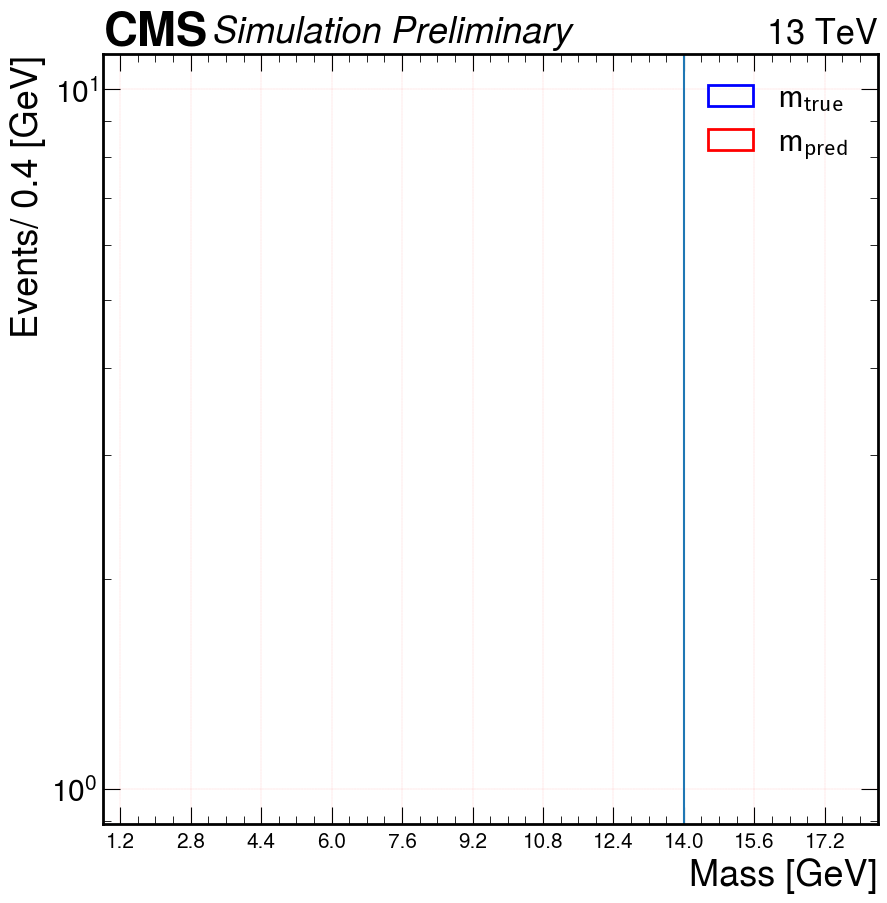

In [11]:
m_true, m_pred = [], []
for i in range(len(m_true_)):
    if m_true_[i]<19.2 or m_true_[i] >9.7 :continue
    m_true.append(m_true_[i])
    m_pred.append(m_pred_[i])
    
bin_size=.4
fig, ax = plt.subplots(figsize=(10,10))
plt.hist(np.squeeze(m_true), range=(1.2,18), bins=len(np.arange(9,18+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{true}}$', linestyle='-', color='blue', linewidth=2,log=1)
plt.hist(np.squeeze(m_pred), range=(1.2,18), bins=len(np.arange(9,18+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{pred}}$', linestyle='-', color='red', linewidth=2,log=1)
plt.xlim(1.2-bin_size,18+bin_size)
plt.xticks(np.arange(1.2,18+bin_size,1.6),size=15)
plt.grid(color='r', linestyle='--', linewidth=.1)
plt.xlabel('Mass [GeV]')
plt.ylabel('Events/ 0.4 [GeV]' )
plt.axvline(x=14)
# plt.title(r'$\mathrm{m_{true}}$, $\mathrm{m_{pred}}$ masses', size=25)
plt.legend(loc='upper right')
hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtru_mpred_hist_truncate.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()    
        

###----------------m0To17p2_unphysical_over_populated--------------------------------------------

In [12]:
local='/home/bbbam/mass_trainer_aToTauTau_m0To17p2_unphysical_over_populated/INFERENCE_DATA/5_channels_Tracks_pt_Tracks_dZSig_Tracks_d0Sig_ECAL_energy_HBHE_energy_aToTauTau_pT30To180_with_mass0To17p2_PTscale0.02_ECALscale0_HCALscale1_AOD_m0o14.0_ResNet_blocks3_mae_loss_epochs10_BatchSize1016_from0_ntrain7665720_nval559816_run0/'
rhFileList = '%s/*.pkl'%(local)
paths = glob.glob(rhFileList)
assert len(paths) > 0
print(f"{len(paths)} files found")

8 files found


In [24]:
epoch=8

data_file = paths[epoch-1]
infile = open(f"{data_file}", "rb")
data = pickle.load(infile)
print(f"loaded data file ------>  {data_file}")
infile.close()

m_true_ = data["m_true"]
m_pred_ = data["m_pred"]
mae_ = data["mae"]
mre_ = data["mre"]

loaded data file ------>  /home/bbbam/mass_trainer_aToTauTau_m0To17p2_unphysical_over_populated/INFERENCE_DATA/5_channels_Tracks_pt_Tracks_dZSig_Tracks_d0Sig_ECAL_energy_HBHE_energy_aToTauTau_pT30To180_with_mass0To17p2_PTscale0.02_ECALscale0_HCALscale1_AOD_m0o14.0_ResNet_blocks3_mae_loss_epochs10_BatchSize1016_from0_ntrain7665720_nval559816_run0/epoch8_val_pseudoscalar_mae2.0707_inference_data.pkl


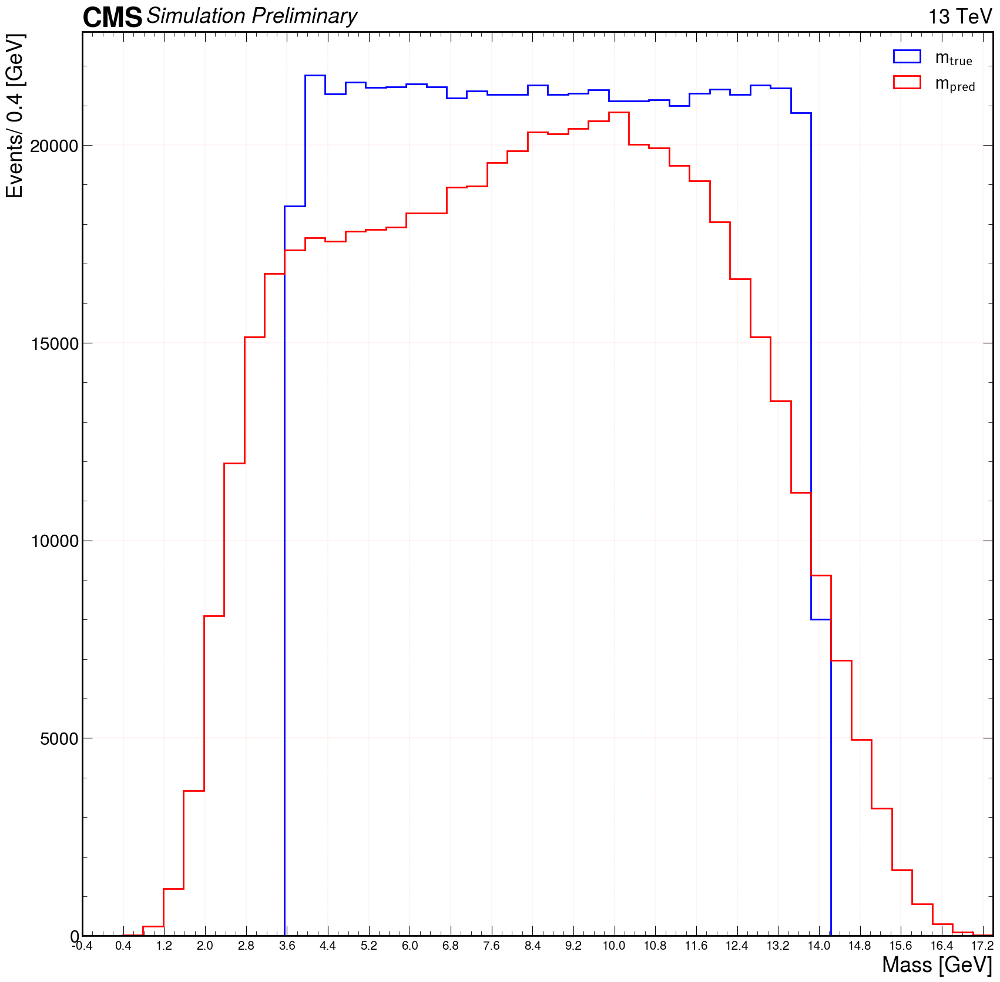

In [27]:
# Check 1D m_pred
# Extebded version
m0_min = 0.8
m0_max = 16.2
bin_size = 0.4
fig, ax = plt.subplots(figsize=(20,20))
plt.hist(m_true_, range=(m0_min-1.2,m0_max+1.2), bins=len(np.arange(m0_min-1.2,m0_max+1.2,bin_size)), histtype='step', label=r'$\mathrm{m_{true}}$', linestyle='-', color='blue', linewidth=2)
plt.hist(m_pred_, range=(m0_min-1.2,m0_max+1.2), bins=len(np.arange(m0_min-1.2,m0_max+1.2,bin_size)), histtype='step', label=r'$\mathrm{m_{pred}}$', linestyle='-', color='red', linewidth=2)
plt.xlim(m0_min-1.2,m0_max+1.2)
plt.xticks(np.arange(m0_min-1.2,m0_max+1.2,0.8),size=15)
plt.grid(color='r', linestyle='--', linewidth=.1)
plt.xlabel('Mass [GeV]')
plt.ylabel('Events/ 0.4 [GeV]')
# plt.title(r'$\mathrm{m_{true}}$, $\mathrm{m_{pred}}$ masses',size=25)
plt.legend(loc='upper right')
hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtru_mpred_hist_full.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()

# # Truncated version
# fig, ax = plt.subplots(figsize=(20,20))
# plt.hist(m_true_, range=(m0_min-bin_size,m0_max+bin_size), bins=len(np.arange(m0_min-0.4,m0_max+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{true}}$', linestyle='-', color='blue', linewidth=2)
# plt.hist(m_pred_, range=(m0_min-bin_size,m0_max+bin_size), bins=len(np.arange(m0_min-0.4,m0_max+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{pred}}$', linestyle='-', color='red', linewidth=2)
# plt.xlim(m0_min-bin_size,m0_max+bin_size)
# plt.xticks(np.arange(m0_min,m0_max+bin_size,bin_size),size=15)
# plt.grid(color='r', linestyle='--', linewidth=.1)
# plt.xlabel('Mass [GeV]')
# plt.ylabel('Events/ 0.4 [GeV]' )
# # plt.title(r'$\mathrm{m_{true}}$, $\mathrm{m_{pred}}$ masses', size=25)
# plt.legend(loc='upper right')
# hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# # plt.savefig('%s/%d_mtru_mpred_hist_truncate.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
# plt.show()

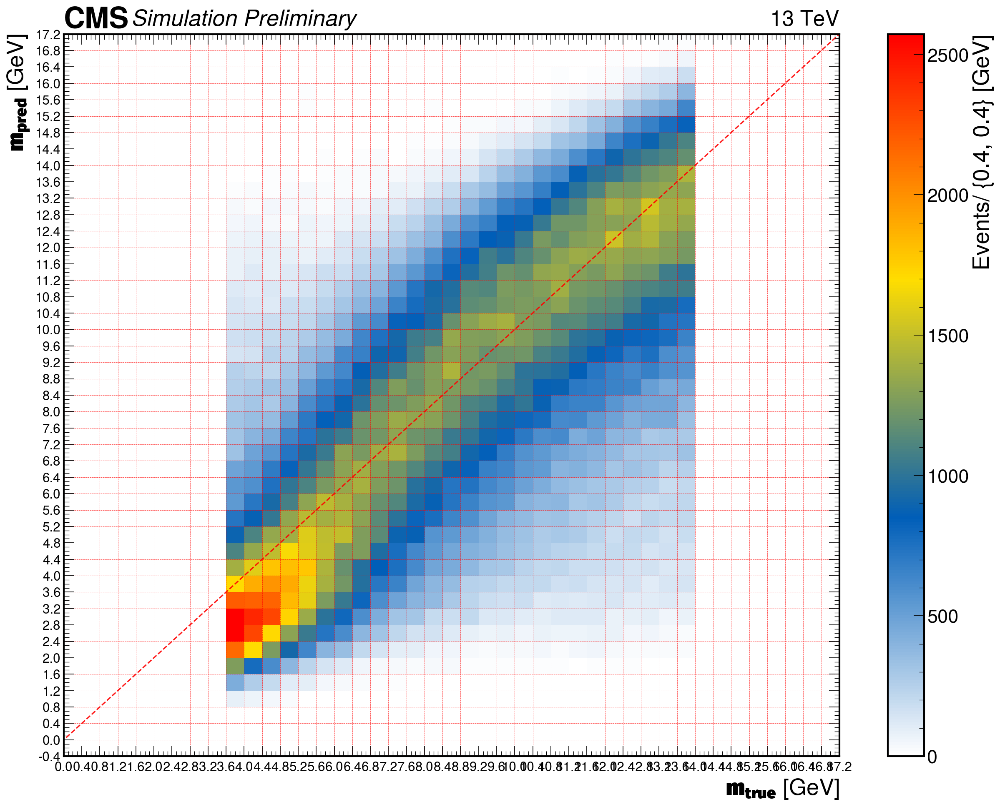

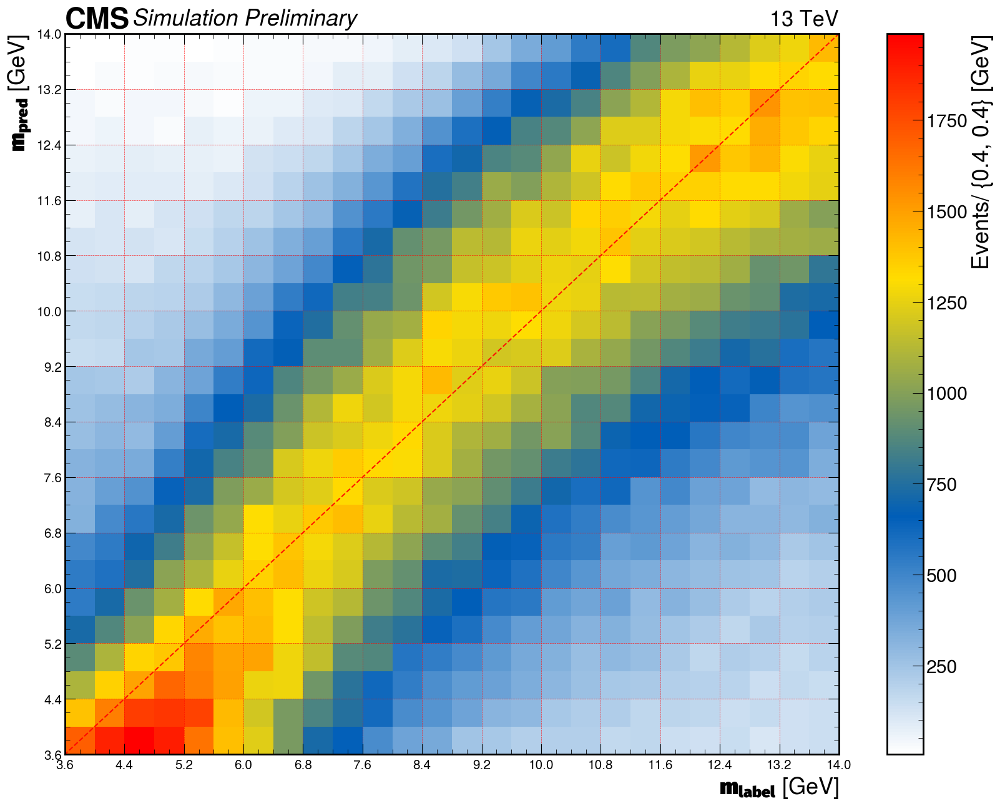

In [140]:
# 2D hist mteru and mpred
# Extended version
fig, ax = plt.subplots(figsize=(20,15), dpi=150)
plt.hist2d(np.squeeze(m_true_), np.squeeze(m_pred_), bins=[np.arange(m0_min-0.8, m0_max+1.2, .4), np.arange(m0_min-1.2, m0_max+1.2, .4)],cmap=cms_cmap)
plt.xlabel(r'$\mathrm{m_{true}}$ [GeV]')
plt.ylabel(r'$\mathrm{m_{pred}}$ [GeV]')
plt.plot((m0_min-1.2, m0_max+1.2), (m0_min-1.2, m0_max+1.2), color='r', linestyle='--', alpha=0.9)
plt.xticks(np.arange(m0_min-0.8, m0_max+1.2, .4),size=15)
plt.yticks(np.arange(m0_min-1.2, m0_max+1.2, .4),size=15)
plt.colorbar().set_label(label='Events/ {0.4, 0.4} [GeV]' )
plt.grid(color='r', linestyle='--', linewidth=.4)
hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtrue_mpred_2D_hist_full.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()

# Truncated version
fig, ax = plt.subplots(figsize=(20,15))
hist = plt.hist2d(np.squeeze(m_true_), np.squeeze(m_pred_), bins=[np.arange(3.6, 14.1, .4), np.arange(3.6, 14.1, .4)],cmap=cms_cmap)
plt.xlabel(r'$\mathrm{m_{label}}$ [GeV]')
plt.ylabel(r'$\mathrm{m_{pred}}$ [GeV]')
plt.plot((m0_min, m0_max), (m0_min, m0_max), color='r', linestyle='--', alpha=0.9)
plt.xticks(np.arange(3.6, 14.1, .8),size=15)
plt.yticks(np.arange(3.6, 14.1, .8),size=15)
plt.colorbar().set_label(label='Events/ {0.4, 0.4} [GeV]')
plt.grid(color='r', linestyle='--', linewidth=.5)

hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtrue_mpred_2D_hist_truncated.png'%(out_dir, epoch),  bbox_inches='tight', dpi=300, facecolor = "w")
plt.show()

##---------------------m1p2To17p2_unphysical_over_populated-----------------------------

In [144]:
# local='/home/bbbam/mass_trainer_aToTauTau_m1p2To17p2_unphysical_over_populated/INFERENCE_DATA/5_channels_Tracks_pt_Tracks_dZSig_Tracks_d0Sig_ECAL_energy_HBHE_energy_aToTauTau_pT30To180_with_mass1p2To17p2_PTscale0.02_ECALscale0_HCALscale1_AOD_m0o14.0_ResNet_blocks3_mae_loss_epochs10_BatchSize1024_from0_ntrain7200768_nval560128_run0'
# rhFileList = '%s/*.pkl'%(local)
# paths = glob.glob(rhFileList)
# assert len(paths) > 0
# print(f"{len(paths)} files found")

In [145]:
# local='/home/bbbam/mass_trainer_aToTauTau_m1p2To17p2_unphysical_over_populated/INFERENCE_DATA/5_channels_Tracks_pt_Tracks_dZSig_Tracks_d0Sig_ECAL_energy_HBHE_energy_aToTauTau_pT30To180_with_mass1p2To17p2_PTscale0.02_ECALscale0_HCALscale1_AOD_m0o14.0_ResNet_blocks3_mae_loss_epochs10_BatchSize1024_from9_ntrain7200768_nval560128_run0/'
# rhFileList = '%s/*.pkl'%(local)
# paths = glob.glob(rhFileList)
# assert len(paths) > 0
# print(f"{len(paths)} files found")

In [13]:
local='/home/bbbam/mass_trainer_aToTauTau_m1p2To17p2_unphysical_over_populated/INFERENCE_DATA/5_channels_Tracks_pt_Tracks_dZSig_Tracks_d0Sig_ECAL_energy_HBHE_energy_aToTauTau_pT30To180_with_mass1p2To17p2_PTscale0.02_ECALscale0_HCALscale1_AOD_m0o14.0_ResNet_blocks3_mae_loss_epochs10_BatchSize1024_from18_ntrain7200768_nval560128_run0/'
rhFileList = '%s/*.pkl'%(local)
paths = glob.glob(rhFileList)
assert len(paths) > 0
print(f"{len(paths)} files found")

10 files found


In [14]:
epoch =10
previous_epoch =18
data_file = paths[epoch-1]
infile = open(f"{data_file}", "rb")
data = pickle.load(infile)
print(f"loaded data file ------>  {data_file}")
infile.close()

m_true_ = data["m_true"]
m_pred_ = data["m_pred"]
mae_ = data["mae"]
mre_ = data["mre"]

loaded data file ------>  /home/bbbam/mass_trainer_aToTauTau_m1p2To17p2_unphysical_over_populated/INFERENCE_DATA/5_channels_Tracks_pt_Tracks_dZSig_Tracks_d0Sig_ECAL_energy_HBHE_energy_aToTauTau_pT30To180_with_mass1p2To17p2_PTscale0.02_ECALscale0_HCALscale1_AOD_m0o14.0_ResNet_blocks3_mae_loss_epochs10_BatchSize1024_from18_ntrain7200768_nval560128_run0/epoch28_val_pseudoscalar_mae1.8563_inference_data.pkl


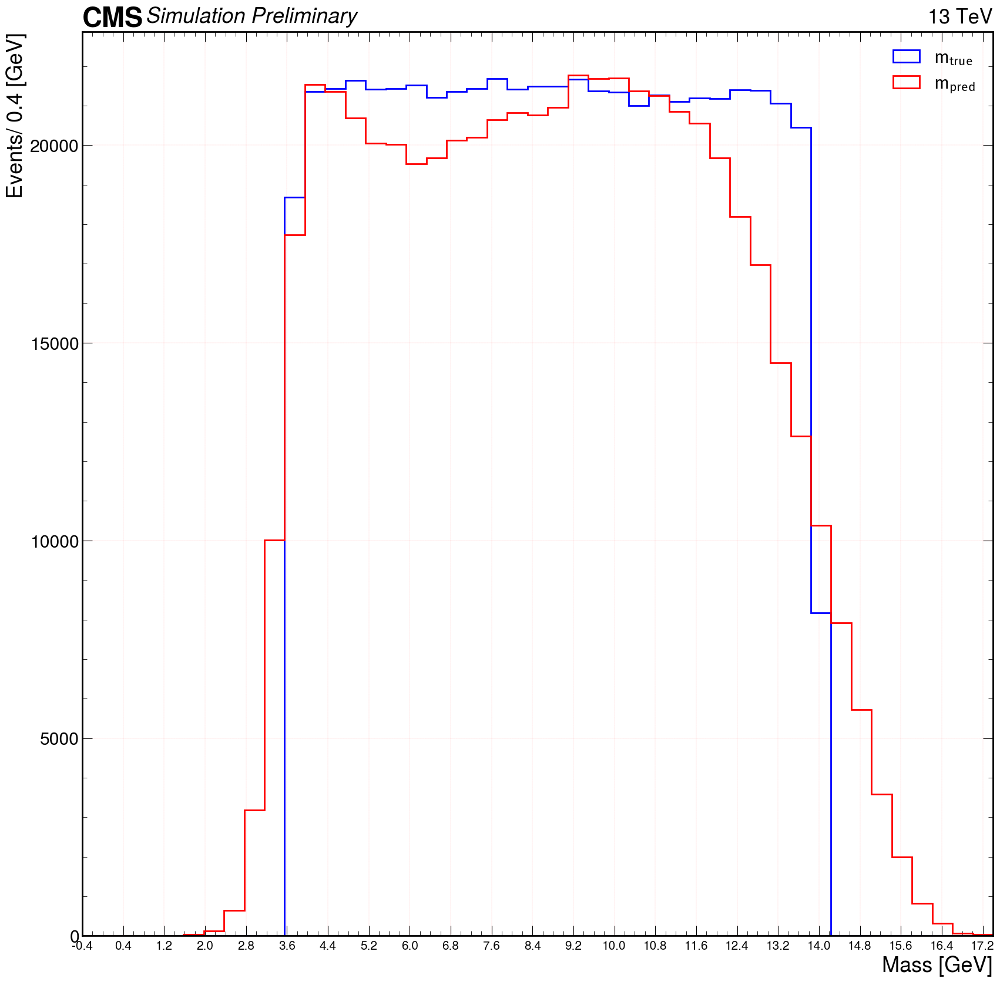

In [15]:
# Check 1D m_pred
# Extebded version
m0_min = 0.8
m0_max = 16.2
bin_size = 0.4
fig, ax = plt.subplots(figsize=(20,20))
plt.hist(m_true_, range=(m0_min-1.2,m0_max+1.2), bins=len(np.arange(m0_min-1.2,m0_max+1.2,bin_size)), histtype='step', label=r'$\mathrm{m_{true}}$', linestyle='-', color='blue', linewidth=2)
plt.hist(m_pred_, range=(m0_min-1.2,m0_max+1.2), bins=len(np.arange(m0_min-1.2,m0_max+1.2,bin_size)), histtype='step', label=r'$\mathrm{m_{pred}}$', linestyle='-', color='red', linewidth=2)
plt.xlim(m0_min-1.2,m0_max+1.2)
plt.xticks(np.arange(m0_min-1.2,m0_max+1.2,0.8),size=15)
plt.grid(color='r', linestyle='--', linewidth=.1)
plt.xlabel('Mass [GeV]')
plt.ylabel('Events/ 0.4 [GeV]')
# plt.title(r'$\mathrm{m_{true}}$, $\mathrm{m_{pred}}$ masses',size=25)
plt.legend(loc='upper right')
hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtru_mpred_hist_full.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()

# # Truncated version
# fig, ax = plt.subplots(figsize=(20,20))
# plt.hist(m_true_, range=(3.6,14), bins=len(np.arange(3.6,14+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{true}}$', linestyle='-', color='blue', linewidth=2)
# plt.hist(m_pred_, range=(3.6,14), bins=len(np.arange(3.6,14+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{pred}}$', linestyle='-', color='red', linewidth=2)
# plt.xlim(3.6-bin_size,14+bin_size)
# plt.xticks(np.arange(3.6,14+bin_size,bin_size),size=15)
# plt.grid(color='r', linestyle='--', linewidth=.1)
# plt.xlabel('Mass [GeV]')
# plt.ylabel('Events/ 0.4 [GeV]' )
# # plt.title(r'$\mathrm{m_{true}}$, $\mathrm{m_{pred}}$ masses', size=25)
# plt.legend(loc='upper right')
# hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# # plt.savefig('%s/%d_mtru_mpred_hist_truncate.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
# plt.show()

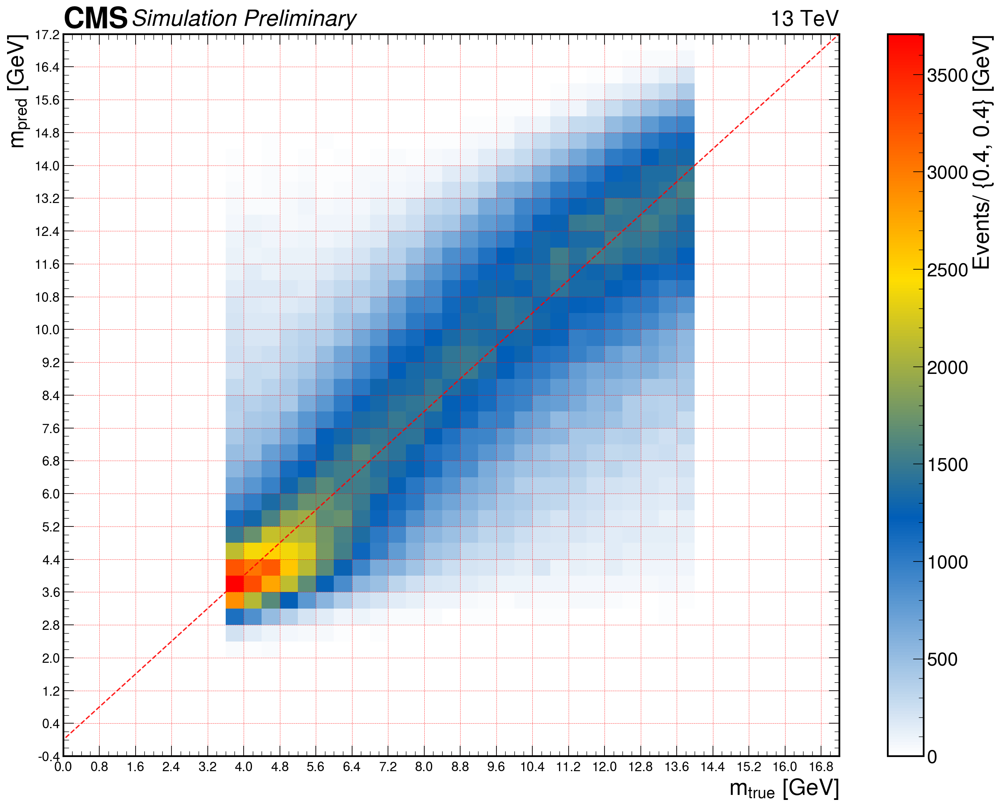

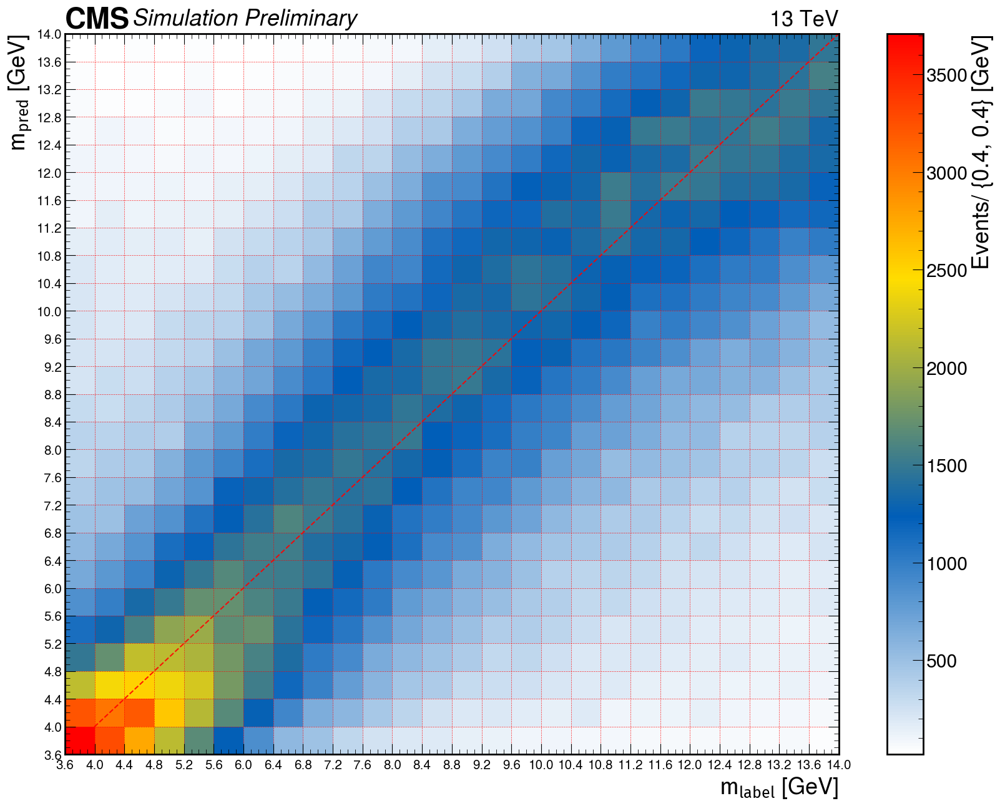

In [16]:
# 2D hist mteru and mpred
# Extended version
fig, ax = plt.subplots(figsize=(20,15), dpi=150)
norm = mcolors.TwoSlopeNorm(vmin=0, vmax = 1000, vcenter=500)
plt.hist2d(np.squeeze(m_true_), np.squeeze(m_pred_), bins=[np.arange(m0_min-0.8, m0_max+1.2, .4), np.arange(m0_min-1.2, m0_max+1.2, .4)],cmap=cms_cmap)
plt.xlabel(r'${m_{true}}$ [GeV]')
plt.ylabel(r'${m_{pred}}$ [GeV]')
plt.plot((m0_min-1.2, m0_max+1.2), (m0_min-1.2, m0_max+1.2), color='r', linestyle='--', alpha=0.9)
plt.xticks(np.arange(m0_min-0.8, m0_max+1.2, .8),size=15)
plt.yticks(np.arange(m0_min-1.2, m0_max+1.2, .8),size=15)
plt.colorbar().set_label(label='Events/ {0.4, 0.4} [GeV]' )
plt.grid(color='r', linestyle='--', linewidth=.4)
hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtrue_mpred_2D_hist_full.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()

# Truncated version
fig, ax = plt.subplots(figsize=(20,15))
hist = plt.hist2d(np.squeeze(m_true_), np.squeeze(m_pred_), bins=[np.arange(3.6, 14.1, .4), np.arange(3.6, 14.1, .4)],cmap=cms_cmap)
plt.xlabel(r'$\mathrm{m_{label}}$ [GeV]')
plt.ylabel(r'$\mathrm{m_{pred}}$ [GeV]')
plt.plot((m0_min, m0_max), (m0_min, m0_max), color='r', linestyle='--', alpha=0.9)
plt.xticks(np.arange(3.6, 14.1, .4),size=15)
plt.yticks(np.arange(3.6, 14.1, .4),size=15)
plt.colorbar().set_label(label='Events/ {0.4, 0.4} [GeV]')
plt.grid(color='r', linestyle='--', linewidth=.5)

hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtrue_mpred_2D_hist_truncated.png'%(out_dir, epoch),  bbox_inches='tight', dpi=300, facecolor = "w")
plt.show()

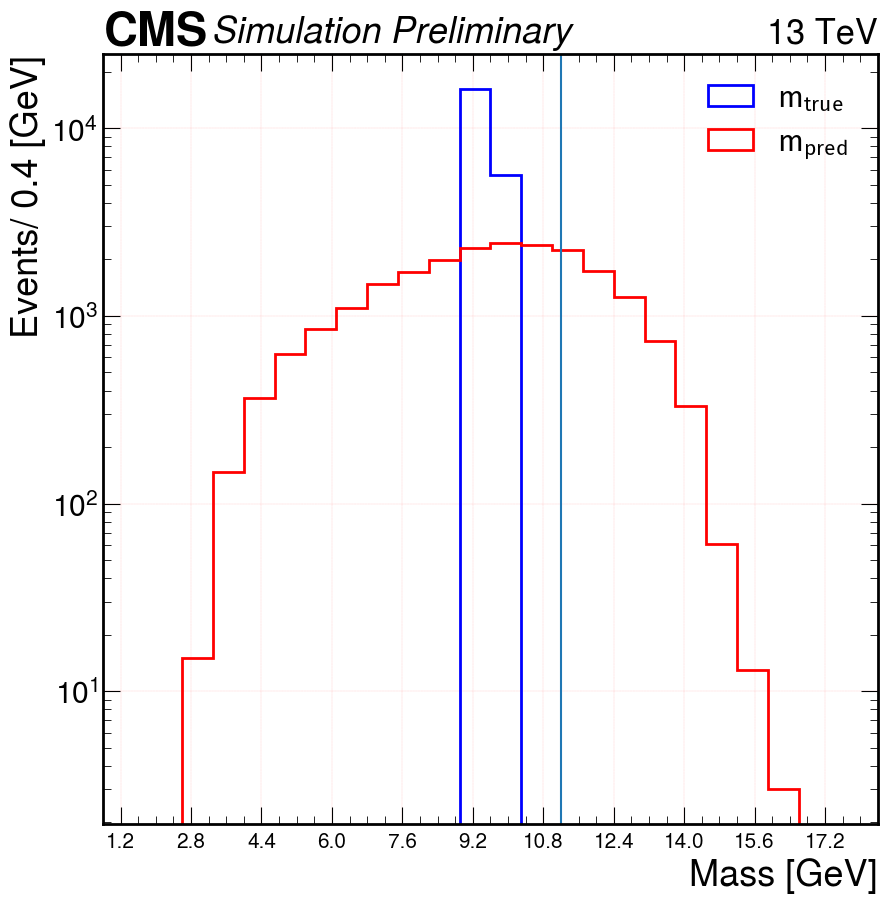

In [19]:
m_true, m_pred = [], []
for i in range(len(m_true_)):
    if m_true_[i]<9.3 or m_true_[i] >9.7 :continue
    m_true.append(m_true_[i])
    m_pred.append(m_pred_[i])
    
bin_size=.4
fig, ax = plt.subplots(figsize=(10,10))
plt.hist(np.squeeze(m_true), range=(1.2,18), bins=len(np.arange(9,18+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{true}}$', linestyle='-', color='blue', linewidth=2,log=1)
plt.hist(np.squeeze(m_pred), range=(1.2,18), bins=len(np.arange(9,18+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{pred}}$', linestyle='-', color='red', linewidth=2,log=1)
plt.xlim(1.2-bin_size,18+bin_size)
plt.xticks(np.arange(1.2,18+bin_size,1.6),size=15)
plt.grid(color='r', linestyle='--', linewidth=.1)
plt.xlabel('Mass [GeV]')
plt.ylabel('Events/ 0.4 [GeV]' )
plt.axvline(x=11.2)
# plt.title(r'$\mathrm{m_{true}}$, $\mathrm{m_{pred}}$ masses', size=25)
plt.legend(loc='upper right')
hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtru_mpred_hist_truncate.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()    
        

# -----------------------m1p2To14_unphysical_over_populated_less_data_lowerUnPhysical_range------------

In [21]:
local='/home/bbbam/mass_trainer_aToTauTau_m1p2To14_unphysical_over_populated_less_data_lowerUnPhysical_range/INFERENCE_DATA/5_channels_aToTauTau_pT30To180_with_mass1p2To14_less_data_lowerUnphy_range_PTscale0.02_ECALscale0_HCALscale1_AOD_m0o14.0_ResNet_blocks3_mae_loss_epochs10_BatchSize1024_from0_ntrain5395456_nval560128_run0/'
rhFileList = '%s/*.pkl'%(local)
paths = glob.glob(rhFileList)
assert len(paths) > 0
print(f"{len(paths)} files found")

10 files found


In [22]:
epoch = 10
data_file = paths[epoch-1]
infile = open(f"{data_file}", "rb")
data = pickle.load(infile)
print(f"loaded data file ------>  {data_file}")
infile.close()

m_true_ = data["m_true"]
m_pred_ = data["m_pred"]
mae_ = data["mae"]
mre_ = data["mre"]

loaded data file ------>  /home/bbbam/mass_trainer_aToTauTau_m1p2To14_unphysical_over_populated_less_data_lowerUnPhysical_range/INFERENCE_DATA/5_channels_aToTauTau_pT30To180_with_mass1p2To14_less_data_lowerUnphy_range_PTscale0.02_ECALscale0_HCALscale1_AOD_m0o14.0_ResNet_blocks3_mae_loss_epochs10_BatchSize1024_from0_ntrain5395456_nval560128_run0/epoch10_val_pseudoscalar_mae1.7601_inference_data.pkl


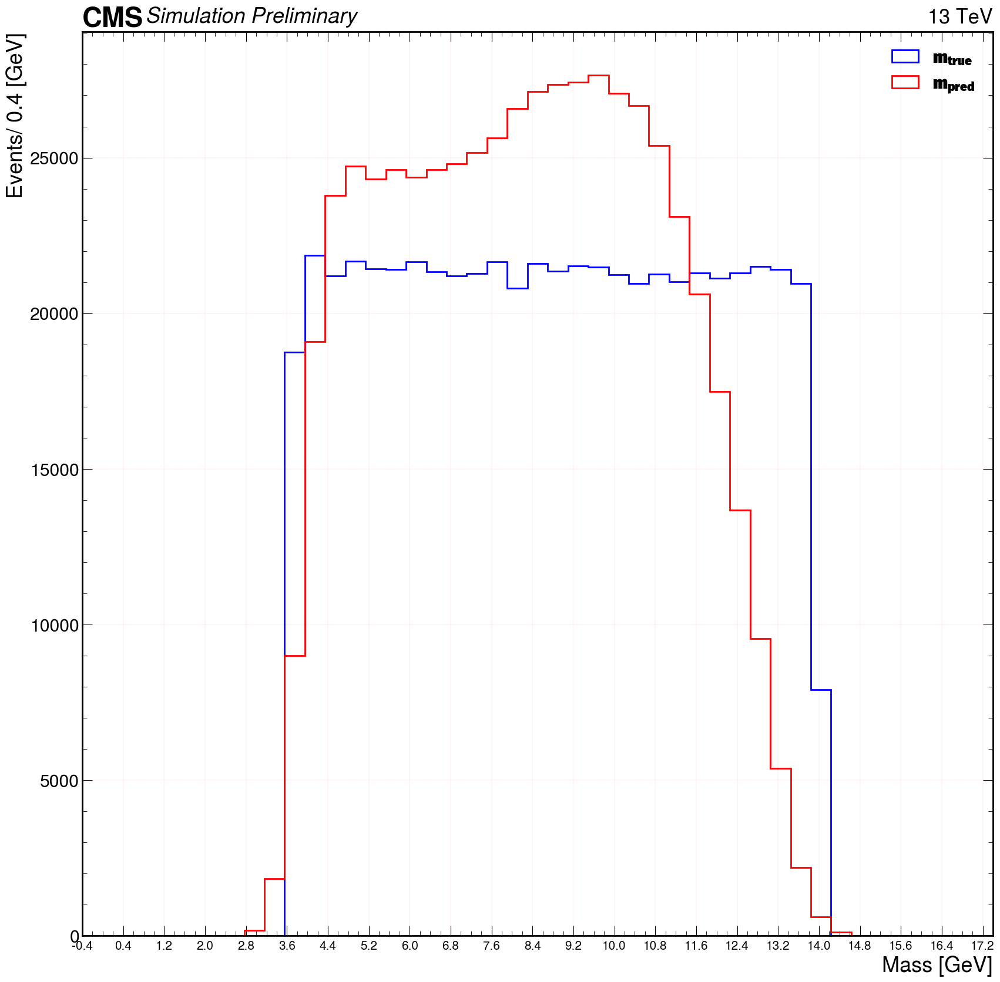

In [23]:
# Check 1D m_pred
# Extebded version
m0_min = 0.8
m0_max = 16.2
bin_size = 0.4
fig, ax = plt.subplots(figsize=(20,20))
plt.hist(m_true_, range=(m0_min-1.2,m0_max+1.2), bins=len(np.arange(m0_min-1.2,m0_max+1.2,bin_size)), histtype='step', label=r'$\mathrm{m_{true}}$', linestyle='-', color='blue', linewidth=2)
plt.hist(m_pred_, range=(m0_min-1.2,m0_max+1.2), bins=len(np.arange(m0_min-1.2,m0_max+1.2,bin_size)), histtype='step', label=r'$\mathrm{m_{pred}}$', linestyle='-', color='red', linewidth=2)
plt.xlim(m0_min-1.2,m0_max+1.2)
plt.xticks(np.arange(m0_min-1.2,m0_max+1.2,.8),size=15)
plt.grid(color='r', linestyle='--', linewidth=.1)
plt.xlabel('Mass [GeV]')
plt.ylabel('Events/ 0.4 [GeV]')
# plt.title(r'$\mathrm{m_{true}}$, $\mathrm{m_{pred}}$ masses',size=25)
plt.legend(loc='upper right')
hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtru_mpred_hist_full.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()

# # Truncated version
# fig, ax = plt.subplots(figsize=(20,20))
# plt.hist(m_true_, range=(3.6,14), bins=len(np.arange(3.6,14+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{true}}$', linestyle='-', color='blue', linewidth=2)
# plt.hist(m_pred_, range=(3.6,14), bins=len(np.arange(3.6,14+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{pred}}$', linestyle='-', color='red', linewidth=2)
# plt.xlim(3.6-bin_size,14+bin_size)
# plt.xticks(np.arange(3.6,14+bin_size,bin_size),size=15)
# plt.grid(color='r', linestyle='--', linewidth=.1)
# plt.xlabel('Mass [GeV]')
# plt.ylabel('Events/ 0.4 [GeV]' )
# # plt.title(r'$\mathrm{m_{true}}$, $\mathrm{m_{pred}}$ masses', size=25)
# plt.legend(loc='upper right')
# hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# # plt.savefig('%s/%d_mtru_mpred_hist_truncate.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
# plt.show()

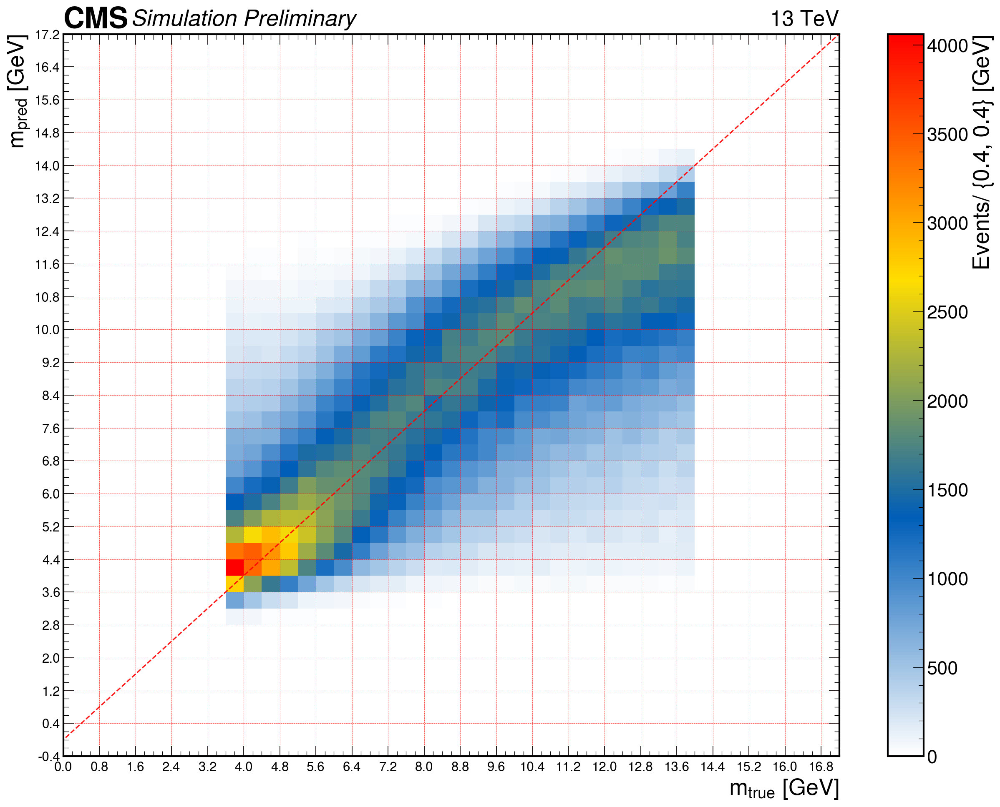

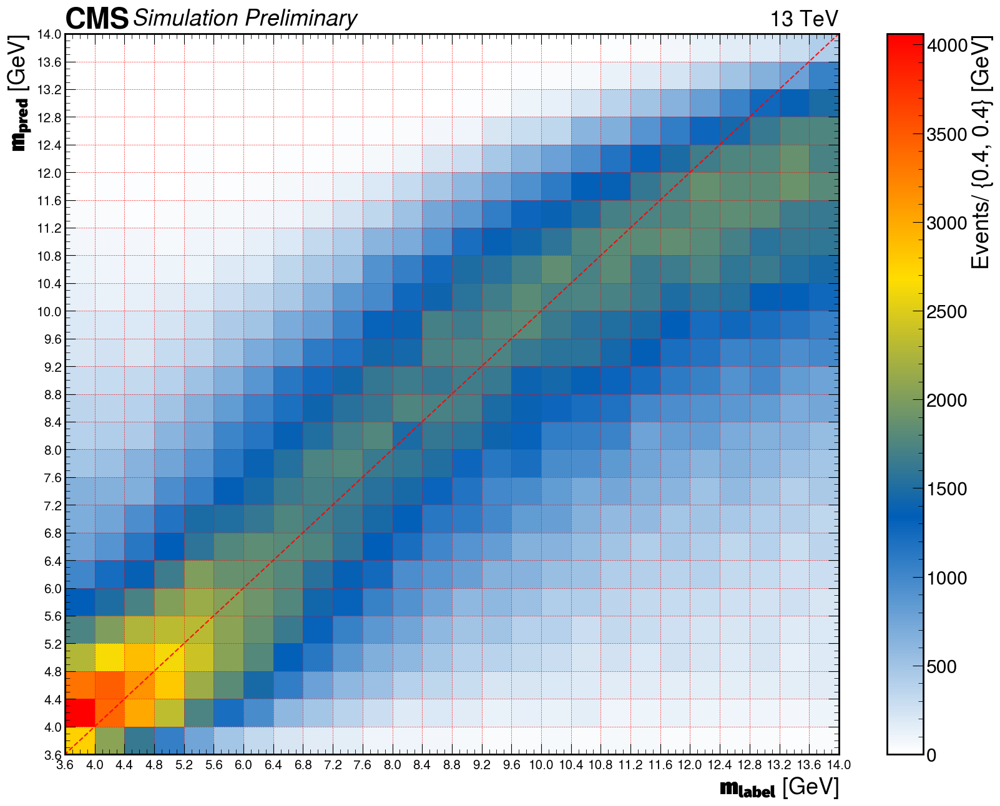

In [24]:
# 2D hist mteru and mpred
# Extended version
fig, ax = plt.subplots(figsize=(20,15), dpi=150)
norm = mcolors.TwoSlopeNorm(vmin=0, vmax = 1000, vcenter=500)
plt.hist2d(np.squeeze(m_true_), np.squeeze(m_pred_), bins=[np.arange(m0_min-0.8, m0_max+1.2, .4), np.arange(m0_min-1.2, m0_max+1.2, .4)],cmap=cms_cmap)
plt.xlabel(r'${m_{true}}$ [GeV]')
plt.ylabel(r'${m_{pred}}$ [GeV]')
plt.plot((m0_min-1.2, m0_max+1.2), (m0_min-1.2, m0_max+1.2), color='r', linestyle='--', alpha=0.9)
plt.xticks(np.arange(m0_min-0.8, m0_max+1.2, .8),size=15)
plt.yticks(np.arange(m0_min-1.2, m0_max+1.2, .8),size=15)
plt.colorbar().set_label(label='Events/ {0.4, 0.4} [GeV]' )
plt.grid(color='r', linestyle='--', linewidth=.4)
hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtrue_mpred_2D_hist_full.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()

# Truncated version
fig, ax = plt.subplots(figsize=(20,15))
hist = plt.hist2d(np.squeeze(m_true_), np.squeeze(m_pred_), bins=[np.arange(3.6, 14.1, .4), np.arange(3.6, 14.1, .4)],cmap=cms_cmap)
plt.xlabel(r'$\mathrm{m_{label}}$ [GeV]')
plt.ylabel(r'$\mathrm{m_{pred}}$ [GeV]')
plt.plot((m0_min, m0_max), (m0_min, m0_max), color='r', linestyle='--', alpha=0.9)
plt.xticks(np.arange(3.6, 14.1, .4),size=15)
plt.yticks(np.arange(3.6, 14.1, .4),size=15)
plt.colorbar().set_label(label='Events/ {0.4, 0.4} [GeV]')
plt.grid(color='r', linestyle='--', linewidth=.5)

hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtrue_mpred_2D_hist_truncated.png'%(out_dir, epoch),  bbox_inches='tight', dpi=300, facecolor = "w")
plt.show()

#--------------------m1p2To17p2_unphysical_over_populated_less_data_lowerUnPhysical_upperOverpopulated_range---

In [25]:
local='/home/bbbam/mass_trainer_aToTauTau_m1p2To17p2_unphysical_over_populated_less_data_lowerUnPhysical_upperOverpopulated_range/INFERENCE_DATA/5_channels_aToTauTau_pT30To180_with_mass1p2To17p2_lessIn_lowerUnphy_upperOverPopulated_PTscale0.02_ECALscale0_HCALscale1_AOD_m0o14.0_ResNet_blocks3_mae_loss_epochs10_BatchSize1024_from0_ntrain6023168_nval560128_run0/'
rhFileList = '%s/*.pkl'%(local)
paths = glob.glob(rhFileList)
assert len(paths) > 0
print(f"{len(paths)} files found")

10 files found


In [26]:
epoch = 10
data_file = paths[epoch-1]
infile = open(f"{data_file}", "rb")
data = pickle.load(infile)
print(f"loaded data file ------>  {data_file}")
infile.close()

m_true_ = data["m_true"]
m_pred_ = data["m_pred"]
mae_ = data["mae"]
mre_ = data["mre"]

loaded data file ------>  /home/bbbam/mass_trainer_aToTauTau_m1p2To17p2_unphysical_over_populated_less_data_lowerUnPhysical_upperOverpopulated_range/INFERENCE_DATA/5_channels_aToTauTau_pT30To180_with_mass1p2To17p2_lessIn_lowerUnphy_upperOverPopulated_PTscale0.02_ECALscale0_HCALscale1_AOD_m0o14.0_ResNet_blocks3_mae_loss_epochs10_BatchSize1024_from0_ntrain6023168_nval560128_run0/epoch10_val_pseudoscalar_mae1.8059_inference_data.pkl


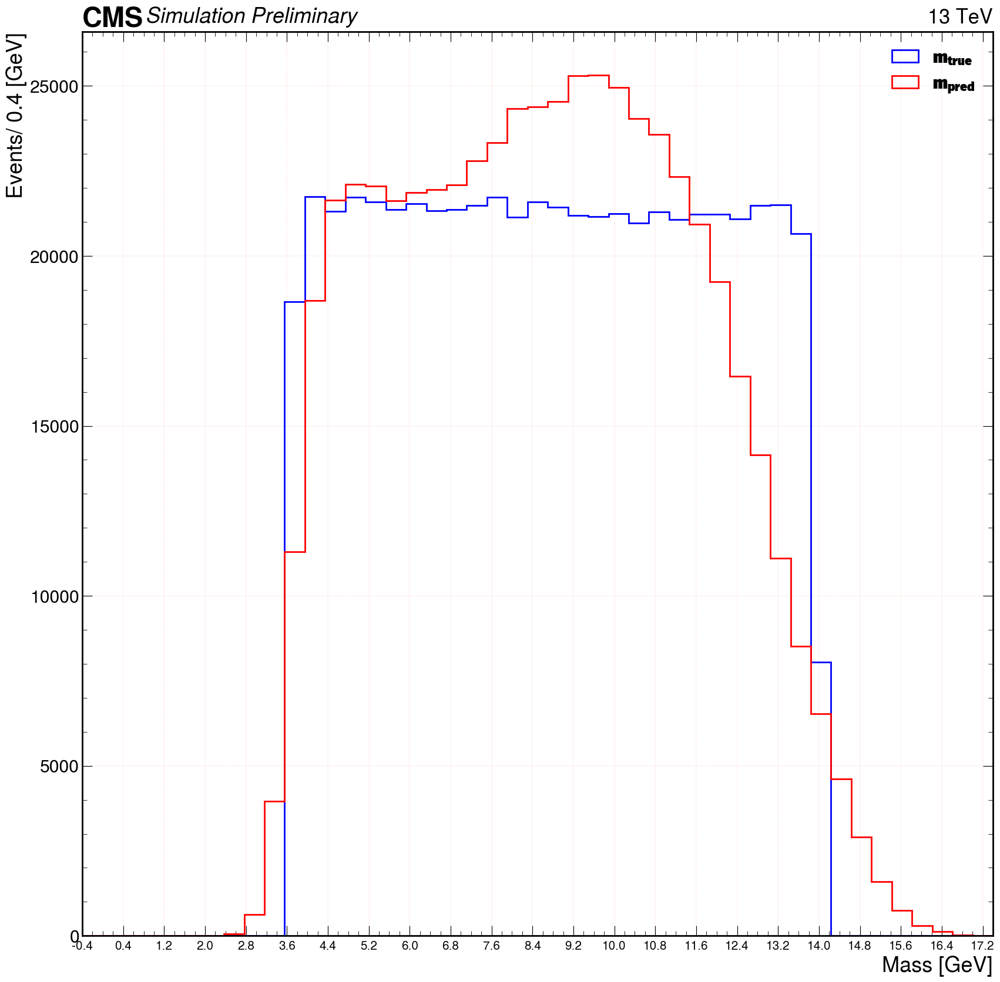

In [27]:
# Check 1D m_pred
# Extebded version
m0_min = 0.8
m0_max = 16.2
bin_size = 0.4
fig, ax = plt.subplots(figsize=(20,20))
plt.hist(m_true_, range=(m0_min-1.2,m0_max+1.2), bins=len(np.arange(m0_min-1.2,m0_max+1.2,bin_size)), histtype='step', label=r'$\mathrm{m_{true}}$', linestyle='-', color='blue', linewidth=2)
plt.hist(m_pred_, range=(m0_min-1.2,m0_max+1.2), bins=len(np.arange(m0_min-1.2,m0_max+1.2,bin_size)), histtype='step', label=r'$\mathrm{m_{pred}}$', linestyle='-', color='red', linewidth=2)
plt.xlim(m0_min-1.2,m0_max+1.2)
plt.xticks(np.arange(m0_min-1.2,m0_max+1.2,0.8),size=15)
plt.grid(color='r', linestyle='--', linewidth=.1)
plt.xlabel('Mass [GeV]')
plt.ylabel('Events/ 0.4 [GeV]')
# plt.title(r'$\mathrm{m_{true}}$, $\mathrm{m_{pred}}$ masses',size=25)
plt.legend(loc='upper right')
hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtru_mpred_hist_full.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()

# # Truncated version
# fig, ax = plt.subplots(figsize=(20,20))
# plt.hist(m_true_, range=(3.6,14), bins=len(np.arange(3.6,14+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{true}}$', linestyle='-', color='blue', linewidth=2)
# plt.hist(m_pred_, range=(3.6,14), bins=len(np.arange(3.6,14+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{pred}}$', linestyle='-', color='red', linewidth=2)
# plt.xlim(3.6-bin_size,14+bin_size)
# plt.xticks(np.arange(3.6,14+bin_size,bin_size),size=15)
# plt.grid(color='r', linestyle='--', linewidth=.1)
# plt.xlabel('Mass [GeV]')
# plt.ylabel('Events/ 0.4 [GeV]' )
# # plt.title(r'$\mathrm{m_{true}}$, $\mathrm{m_{pred}}$ masses', size=25)
# plt.legend(loc='upper right')
# hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# # plt.savefig('%s/%d_mtru_mpred_hist_truncate.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
# plt.show()

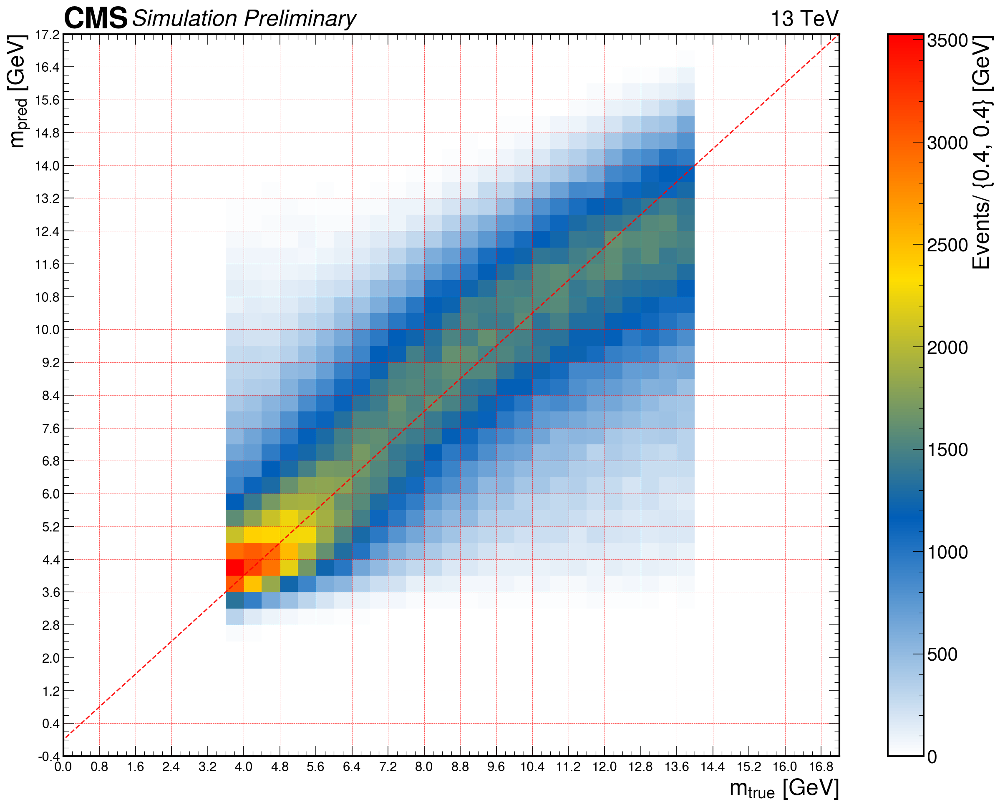

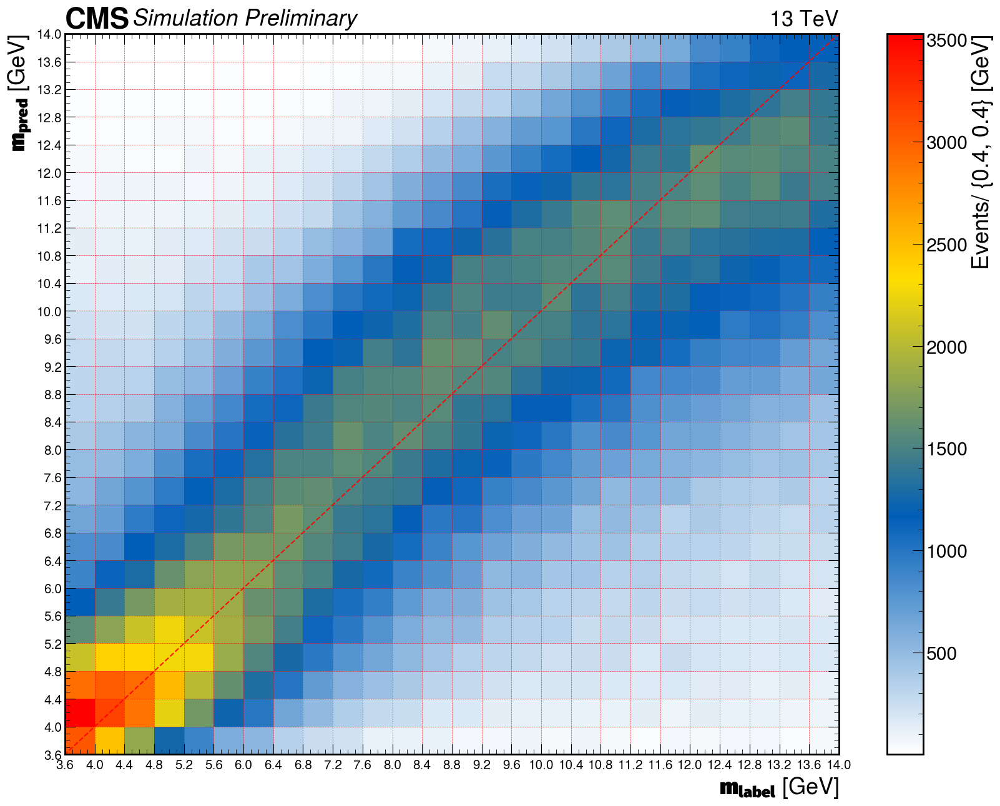

In [28]:
# 2D hist mteru and mpred
# Extended version
fig, ax = plt.subplots(figsize=(20,15), dpi=150)
norm = mcolors.TwoSlopeNorm(vmin=0, vmax = 1000, vcenter=500)
plt.hist2d(np.squeeze(m_true_), np.squeeze(m_pred_), bins=[np.arange(m0_min-0.8, m0_max+1.2, .4), np.arange(m0_min-1.2, m0_max+1.2, .4)],cmap=cms_cmap)
plt.xlabel(r'${m_{true}}$ [GeV]')
plt.ylabel(r'${m_{pred}}$ [GeV]')
plt.plot((m0_min-1.2, m0_max+1.2), (m0_min-1.2, m0_max+1.2), color='r', linestyle='--', alpha=0.9)
plt.xticks(np.arange(m0_min-0.8, m0_max+1.2, .8),size=15)
plt.yticks(np.arange(m0_min-1.2, m0_max+1.2, .8),size=15)
plt.colorbar().set_label(label='Events/ {0.4, 0.4} [GeV]' )
plt.grid(color='r', linestyle='--', linewidth=.4)
hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtrue_mpred_2D_hist_full.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()

# Truncated version
fig, ax = plt.subplots(figsize=(20,15))
hist = plt.hist2d(np.squeeze(m_true_), np.squeeze(m_pred_), bins=[np.arange(3.6, 14.1, .4), np.arange(3.6, 14.1, .4)],cmap=cms_cmap)
plt.xlabel(r'$\mathrm{m_{label}}$ [GeV]')
plt.ylabel(r'$\mathrm{m_{pred}}$ [GeV]')
plt.plot((m0_min, m0_max), (m0_min, m0_max), color='r', linestyle='--', alpha=0.9)
plt.xticks(np.arange(3.6, 14.1, .4),size=15)
plt.yticks(np.arange(3.6, 14.1, .4),size=15)
plt.colorbar().set_label(label='Events/ {0.4, 0.4} [GeV]')
plt.grid(color='r', linestyle='--', linewidth=.5)

hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtrue_mpred_2D_hist_truncated.png'%(out_dir, epoch),  bbox_inches='tight', dpi=300, facecolor = "w")
plt.show()

In [4]:
#----------------------m1p2To17p2_unphysical_over_populated_less_data_lowerUnPhysical_range----------

In [79]:
# local='/home/bbbam/mass_trainer_aToTauTau_m1p2To17p2_unphysical_over_populated_less_data_lowerUnPhysical_range/INFERENCE_DATA/5_channels_aToTauTau_pT30To180_with_mass1p2To17p2_less_data_lowerUnphy_range_PTscale0.02_ECALscale0_HCALscale1_AOD_m0o14.0_ResNet_blocks3_mae_loss_epochs10_BatchSize1024_from0_ntrain6645760_nval560128_run0/'
# rhFileList = '%s/*.pkl'%(local)
# paths = glob.glob(rhFileList)
# assert len(paths) > 0
# print(f"{len(paths)} files found")

10 files found


In [80]:
# local='/home/bbbam/mass_trainer_aToTauTau_m1p2To17p2_unphysical_over_populated_less_data_lowerUnPhysical_range/INFERENCE_DATA/5_channels_aToTauTau_pT30To180_with_mass1p2To17p2_less_data_lowerUnphy_range_PTscale0.02_ECALscale0_HCALscale1_AOD_m0o14.0_ResNet_blocks3_mae_loss_epochs10_BatchSize1024_from10_ntrain6645760_nval560128_run0//'
# rhFileList = '%s/*.pkl'%(local)
# paths = glob.glob(rhFileList)
# assert len(paths) > 0
# print(f"{len(paths)} files found")

10 files found


In [1]:
local='/home/bbbam/mass_trainer_aToTauTau_m1p2To17p2_unphysical_over_populated_less_data_lowerUnPhysical_range/INFERENCE_DATA/5_channels_aToTauTau_pT30To180_with_mass1p2To17p2_less_data_lowerUnphy_range_PTscale0.02_ECALscale0_HCALscale1_AOD_m0o14.0_ResNet_blocks3_mae_loss_epochs15_BatchSize1024_from20_ntrain6645760_nval560128_run0/'
rhFileList = '%s/*.pkl'%(local)
paths = glob.glob(rhFileList)
assert len(paths) > 0
print(f"{len(paths)} files found")

NameError: name 'glob' is not defined

In [21]:
epoch = 12
previous_epoch =10+10
data_file = paths[epoch-1]
infile = open(f"{data_file}", "rb")
data = pickle.load(infile)
print(f"loaded data file ------>  {data_file}")
infile.close()

m_true_ = data["m_true"]
m_pred_ = data["m_pred"]
mae_ = data["mae"]
mre_ = data["mre"]

loaded data file ------>  /home/bbbam/mass_trainer_aToTauTau_m1p2To17p2_unphysical_over_populated_less_data_lowerUnPhysical_range/INFERENCE_DATA/5_channels_aToTauTau_pT30To180_with_mass1p2To17p2_less_data_lowerUnphy_range_PTscale0.02_ECALscale0_HCALscale1_AOD_m0o14.0_ResNet_blocks3_mae_loss_epochs15_BatchSize1024_from20_ntrain6645760_nval560128_run0/epoch32_val_pseudoscalar_mae1.7824_inference_data.pkl


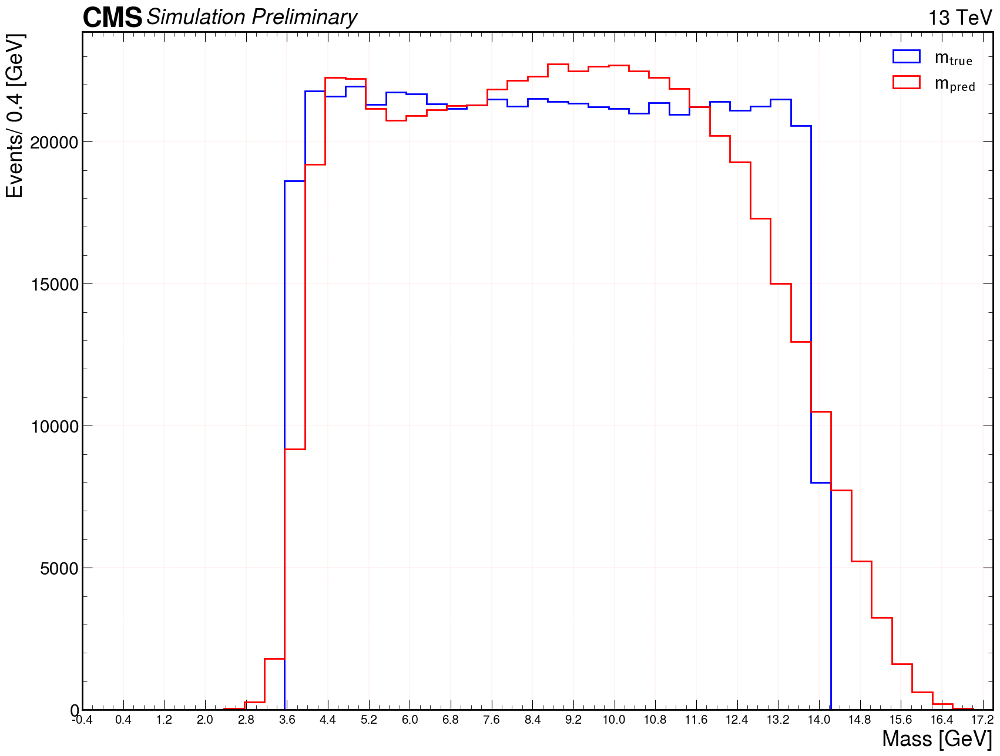

In [22]:
# Check 1D m_pred
# Extebded version
m0_min = 0.8
m0_max = 16.2
bin_size =.4
fig, ax = plt.subplots(figsize=(20,15))
plt.hist(m_true_, range=(m0_min-1.2,m0_max+1.2), bins=len(np.arange(m0_min-1.2,m0_max+1.2,bin_size)), histtype='step', label=r'$\mathrm{m_{true}}$', linestyle='-', color='blue', linewidth=2)
plt.hist(m_pred_, range=(m0_min-1.2,m0_max+1.2), bins=len(np.arange(m0_min-1.2,m0_max+1.2,bin_size)), histtype='step', label=r'$\mathrm{m_{pred}}$', linestyle='-', color='red', linewidth=2)
plt.xlim(m0_min-1.2,m0_max+1.2)
plt.xticks(np.arange(m0_min-1.2,m0_max+1.2,.8),size=15)
plt.grid(color='r', linestyle='--', linewidth=.1)
plt.xlabel('Mass [GeV]')
plt.ylabel('Events/ 0.4 [GeV]')
# plt.title(r'$\mathrm{m_{true}}$, $\mathrm{m_{pred}}$ masses',size=25)
plt.legend(loc='upper right')
hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
plt.savefig('%s/%d_mtru_mpred_hist_mae1.8924_full.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()

# # Truncated version
# fig, ax = plt.subplots(figsize=(20,20))
# plt.hist(m_true_, range=(3.6,14), bins=len(np.arange(3.6,14+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{true}}$', linestyle='-', color='blue', linewidth=2)
# plt.hist(m_pred_, range=(3.6,14), bins=len(np.arange(3.6,14+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{pred}}$', linestyle='-', color='red', linewidth=2)
# plt.xlim(3.6-bin_size,14+bin_size)
# plt.xticks(np.arange(3.6,14+bin_size,bin_size),size=15)
# plt.grid(color='r', linestyle='--', linewidth=.1)
# plt.xlabel('Mass [GeV]')
# plt.ylabel('Events/ 0.4 [GeV]' )
# # plt.title(r'$\mathrm{m_{true}}$, $\mathrm{m_{pred}}$ masses', size=25)
# plt.legend(loc='upper right')
# hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtru_mpred_hist_truncate.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
# plt.show()

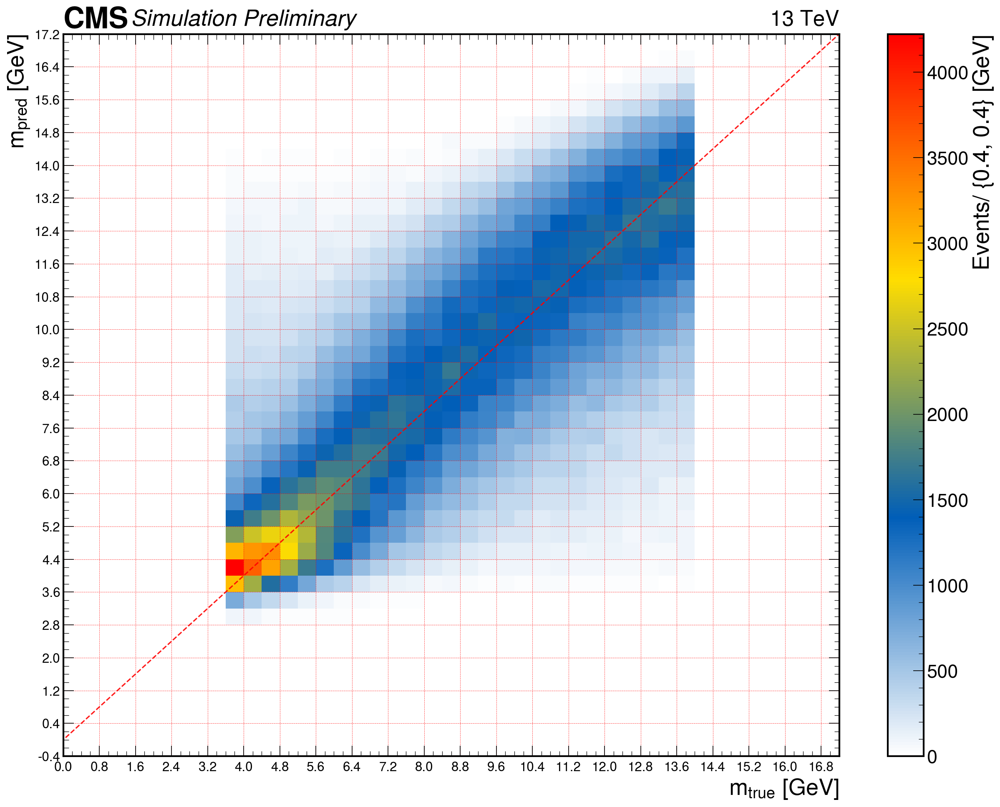

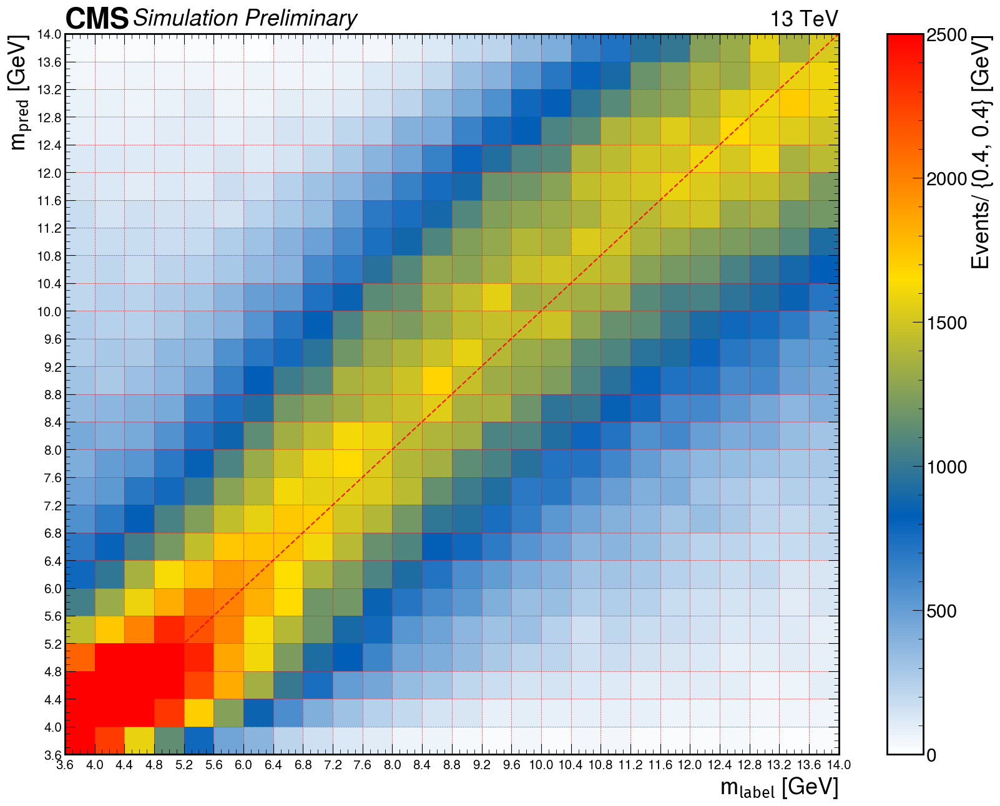

In [23]:
# 2D hist mteru and mpred
# Extended version
fig, ax = plt.subplots(figsize=(20,15), dpi=150)
norm = mcolors.TwoSlopeNorm(vmin=0, vmax = 1000, vcenter=500)
plt.hist2d(np.squeeze(m_true_), np.squeeze(m_pred_), bins=[np.arange(m0_min-0.8, m0_max+1.2, .4), np.arange(m0_min-1.2, m0_max+1.2, .4)],cmap=cms_cmap)
plt.xlabel(r'${m_{true}}$ [GeV]')
plt.ylabel(r'${m_{pred}}$ [GeV]')
plt.plot((m0_min-1.2, m0_max+1.2), (m0_min-1.2, m0_max+1.2), color='r', linestyle='--', alpha=0.9)
plt.xticks(np.arange(m0_min-0.8, m0_max+1.2, .8),size=15)
plt.yticks(np.arange(m0_min-1.2, m0_max+1.2, .8),size=15)
plt.colorbar().set_label(label='Events/ {0.4, 0.4} [GeV]' )
plt.grid(color='r', linestyle='--', linewidth=.4)
hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
plt.savefig('%s/%d_mtrue_mpred_2D_hist_full.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()

# Truncated version
fig, ax = plt.subplots(figsize=(20,15))
norm = mcolors.TwoSlopeNorm(vmin=0, vmax = 2500, vcenter=1250)
hist = plt.hist2d(np.squeeze(m_true_), np.squeeze(m_pred_), bins=[np.arange(3.6, 14.1, .4), np.arange(3.6, 14.1, .4)],cmap=cms_cmap,norm=norm)
plt.xlabel(r'$\mathrm{m_{label}}$ [GeV]')
plt.ylabel(r'$\mathrm{m_{pred}}$ [GeV]')
plt.plot((m0_min, m0_max), (m0_min, m0_max), color='r', linestyle='--', alpha=0.9)
plt.xticks(np.arange(3.6, 14.1, .4),size=15)
plt.yticks(np.arange(3.6, 14.1, .4),size=15)
plt.colorbar().set_label(label='Events/ {0.4, 0.4} [GeV]')
plt.grid(color='r', linestyle='--', linewidth=.5)

hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
plt.savefig('%s/%d_mtrue_mpred_2D_hist_truncated.png'%(out_dir, epoch),  bbox_inches='tight', dpi=300, facecolor = "w")
plt.show()

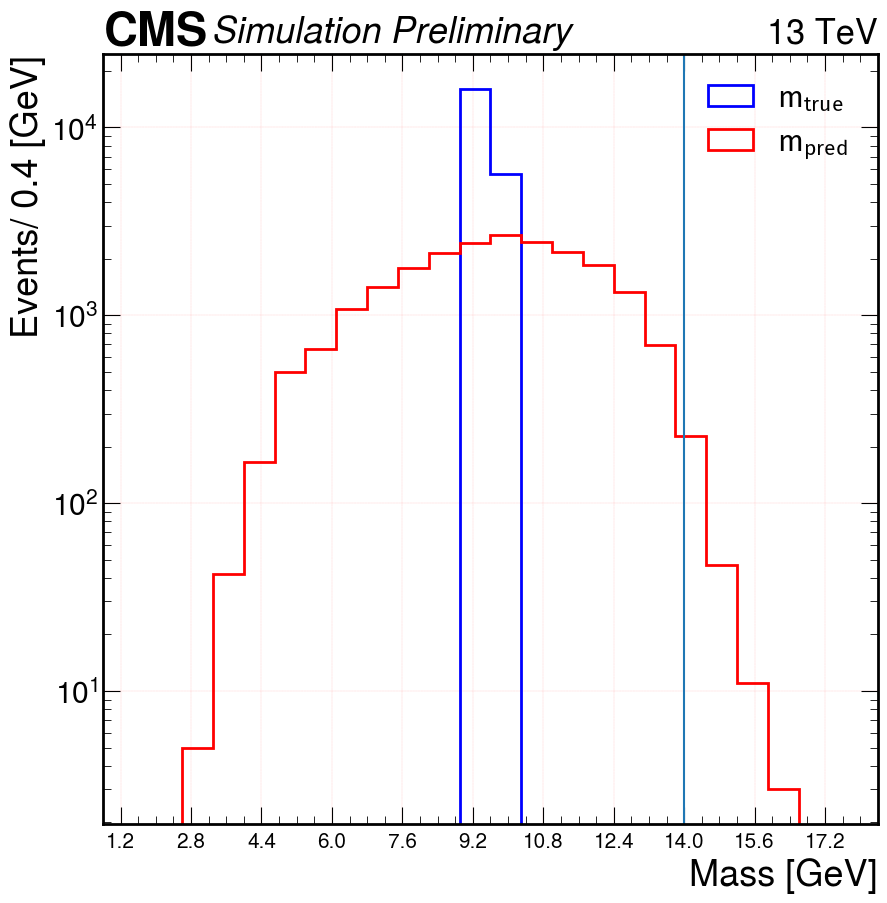

In [25]:
m_true, m_pred = [], []
for i in range(len(m_true_)):
    if m_true_[i]<9.3 or m_true_[i] >9.7 :continue
    m_true.append(m_true_[i])
    m_pred.append(m_pred_[i])
    
bin_size=.4
fig, ax = plt.subplots(figsize=(10,10))
plt.hist(np.squeeze(m_true), range=(1.2,18), bins=len(np.arange(9,18+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{true}}$', linestyle='-', color='blue', linewidth=2,log=1)
plt.hist(np.squeeze(m_pred), range=(1.2,18), bins=len(np.arange(9,18+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{pred}}$', linestyle='-', color='red', linewidth=2,log=1)
plt.xlim(1.2-bin_size,18+bin_size)
plt.xticks(np.arange(1.2,18+bin_size,1.6),size=15)
plt.grid(color='r', linestyle='--', linewidth=.1)
plt.xlabel('Mass [GeV]')
plt.ylabel('Events/ 0.4 [GeV]' )
plt.axvline(x=14)
# plt.title(r'$\mathrm{m_{true}}$, $\mathrm{m_{pred}}$ masses', size=25)
plt.legend(loc='upper right')
hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtru_mpred_hist_truncate.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()    

In [33]:
#----------------------m1p2To17p2_unphysical_over_populated_less_data_lowerUnPhysical_range_huber----------

In [36]:
# local='/home/bbbam/mass_trainer_aToTauTau_m1p2To17p2_unphysical_over_populated_less_data_lowerUnPhysical_range_huber/INFERENCE_DATA/5_channels_aToTauTau_pT30To180_with_mass1p2To17p2_less_data_lowerUnphy_range_PTscale0.02_ECALscale0_HCALscale1_AOD_m0o14.0_ResNet_blocks3_mae_loss_epochs10_BatchSize1024_from0_ntrain6645760_nval560128_run0/'
# rhFileList = '%s/*.pkl'%(local)
# paths = glob.glob(rhFileList)
# assert len(paths) > 0
# print(f"{len(paths)} files found")

In [2]:
local='/home/bbbam/mass_trainer_aToTauTau_m1p2To17p2_unphysical_over_populated_less_data_lowerUnPhysical_range_huber/INFERENCE_DATA/5_channels_aToTauTau_pT30To180_with_mass1p2To17p2_less_data_lowerUnphy_range_PTscale0.02_ECALscale0_HCALscale1_AOD_m0o14.0_ResNet_blocks3_mae_loss_epochs20_BatchSize1024_from0_ntrain6645760_nval560128_run0/'
rhFileList = '%s/*.pkl'%(local)
paths = glob.glob(rhFileList)
assert len(paths) > 0
print(f"{len(paths)} files found")

12 files found


In [3]:
epoch = 12
previous_epoch =10
data_file = paths[epoch-1]
infile = open(f"{data_file}", "rb")
data = pickle.load(infile)
print(f"loaded data file ------>  {data_file}")
infile.close()

m_true_ = data["m_true"]
m_pred_ = data["m_pred"]
mae_ = data["mae"]
mre_ = data["mre"]

loaded data file ------>  /home/bbbam/mass_trainer_aToTauTau_m1p2To17p2_unphysical_over_populated_less_data_lowerUnPhysical_range_huber/INFERENCE_DATA/5_channels_aToTauTau_pT30To180_with_mass1p2To17p2_less_data_lowerUnphy_range_PTscale0.02_ECALscale0_HCALscale1_AOD_m0o14.0_ResNet_blocks3_mae_loss_epochs20_BatchSize1024_from0_ntrain6645760_nval560128_run0/epoch12_val_pseudoscalar_mae1.8155_inference_data.pkl


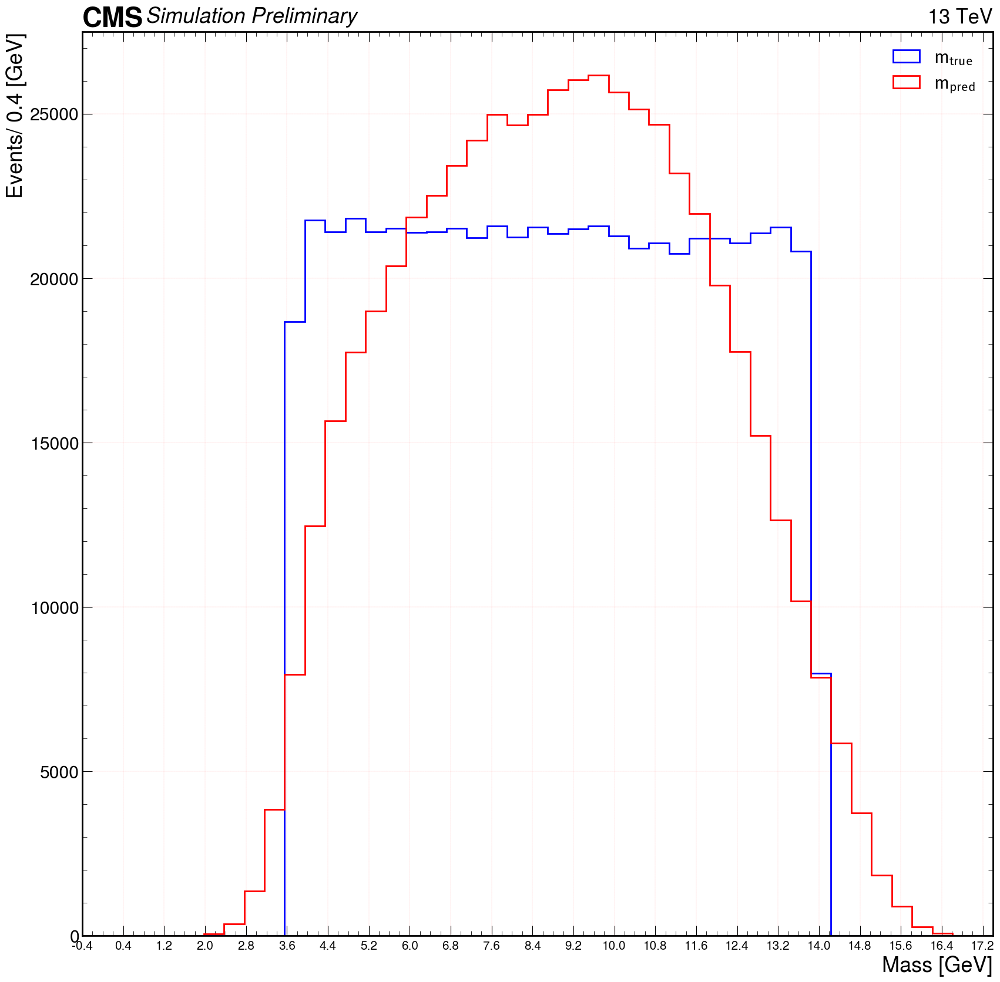

In [4]:
# Check 1D m_pred
# Extebded version
m0_min = 0.8
m0_max = 16.2
bin_size = 0.4
fig, ax = plt.subplots(figsize=(20,20))
plt.hist(m_true_, range=(m0_min-1.2,m0_max+1.2), bins=len(np.arange(m0_min-1.2,m0_max+1.2,bin_size)), histtype='step', label=r'$\mathrm{m_{true}}$', linestyle='-', color='blue', linewidth=2)
plt.hist(m_pred_, range=(m0_min-1.2,m0_max+1.2), bins=len(np.arange(m0_min-1.2,m0_max+1.2,bin_size)), histtype='step', label=r'$\mathrm{m_{pred}}$', linestyle='-', color='red', linewidth=2)
plt.xlim(m0_min-1.2,m0_max+1.2)
plt.xticks(np.arange(m0_min-1.2,m0_max+1.2,.8),size=15)
plt.grid(color='r', linestyle='--', linewidth=.1)
plt.xlabel('Mass [GeV]')
plt.ylabel('Events/ 0.4 [GeV]')
# plt.title(r'$\mathrm{m_{true}}$, $\mathrm{m_{pred}}$ masses',size=25)
plt.legend(loc='upper right')
hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtru_mpred_hist_full.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()

# # Truncated version
# fig, ax = plt.subplots(figsize=(20,20))
# plt.hist(m_true_, range=(3.6,14), bins=len(np.arange(3.6,14+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{true}}$', linestyle='-', color='blue', linewidth=2)
# plt.hist(m_pred_, range=(3.6,14), bins=len(np.arange(3.6,14+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{pred}}$', linestyle='-', color='red', linewidth=2)
# plt.xlim(3.6-bin_size,14+bin_size)
# plt.xticks(np.arange(3.6,14+bin_size,bin_size),size=15)
# plt.grid(color='r', linestyle='--', linewidth=.1)
# plt.xlabel('Mass [GeV]')
# plt.ylabel('Events/ 0.4 [GeV]' )
# # plt.title(r'$\mathrm{m_{true}}$, $\mathrm{m_{pred}}$ masses', size=25)
# plt.legend(loc='upper right')
# hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# # plt.savefig('%s/%d_mtru_mpred_hist_truncate.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
# plt.show()

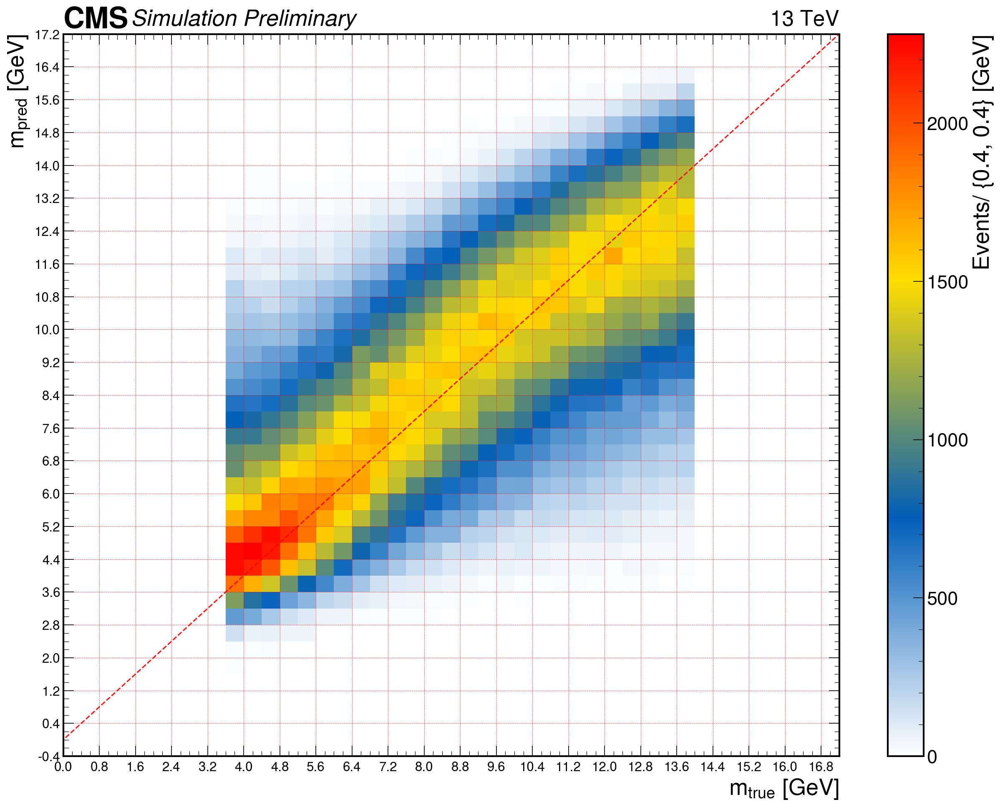

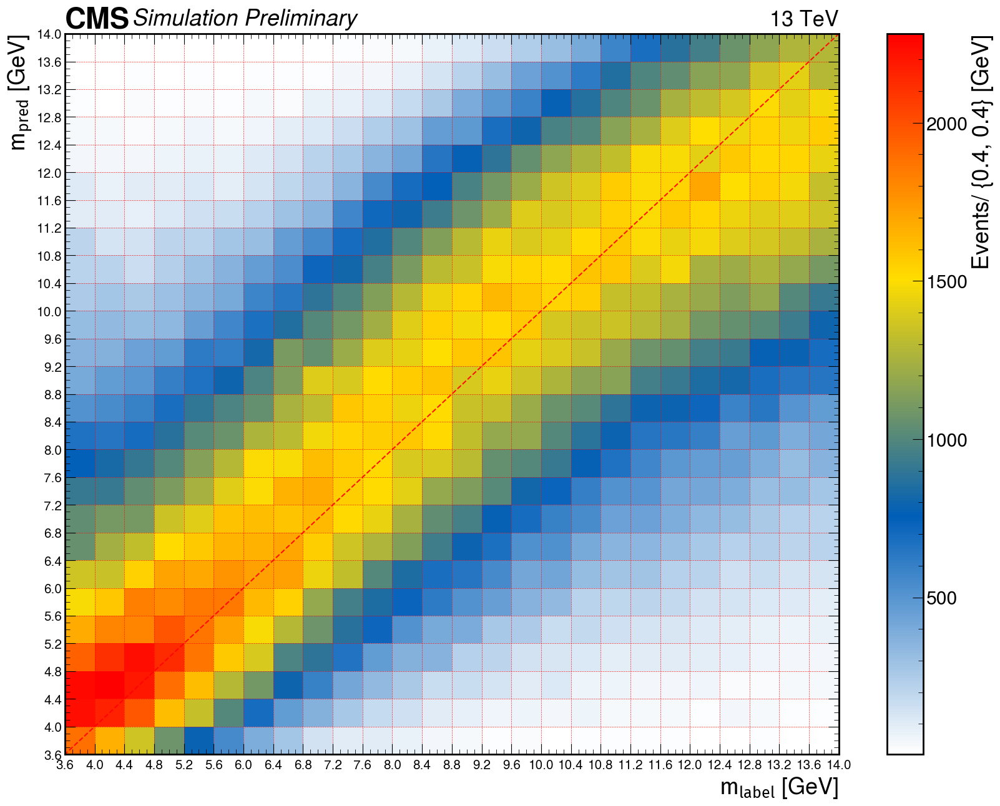

In [5]:
# 2D hist mteru and mpred
# Extended version
fig, ax = plt.subplots(figsize=(20,15), dpi=150)
norm = mcolors.TwoSlopeNorm(vmin=0, vmax = 1000, vcenter=500)
plt.hist2d(np.squeeze(m_true_), np.squeeze(m_pred_), bins=[np.arange(m0_min-0.8, m0_max+1.2, .4), np.arange(m0_min-1.2, m0_max+1.2, .4)],cmap=cms_cmap)
plt.xlabel(r'${m_{true}}$ [GeV]')
plt.ylabel(r'${m_{pred}}$ [GeV]')
plt.plot((m0_min-1.2, m0_max+1.2), (m0_min-1.2, m0_max+1.2), color='r', linestyle='--', alpha=0.9)
plt.xticks(np.arange(m0_min-0.8, m0_max+1.2, .8),size=15)
plt.yticks(np.arange(m0_min-1.2, m0_max+1.2, .8),size=15)
plt.colorbar().set_label(label='Events/ {0.4, 0.4} [GeV]' )
plt.grid(color='r', linestyle='--', linewidth=.4)
hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtrue_mpred_2D_hist_full.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()

# Truncated version
fig, ax = plt.subplots(figsize=(20,15))
hist = plt.hist2d(np.squeeze(m_true_), np.squeeze(m_pred_), bins=[np.arange(3.6, 14.1, .4), np.arange(3.6, 14.1, .4)],cmap=cms_cmap)
plt.xlabel(r'$\mathrm{m_{label}}$ [GeV]')
plt.ylabel(r'$\mathrm{m_{pred}}$ [GeV]')
plt.plot((m0_min, m0_max), (m0_min, m0_max), color='r', linestyle='--', alpha=0.9)
plt.xticks(np.arange(3.6, 14.1, .4),size=15)
plt.yticks(np.arange(3.6, 14.1, .4),size=15)
plt.colorbar().set_label(label='Events/ {0.4, 0.4} [GeV]')
plt.grid(color='r', linestyle='--', linewidth=.5)

hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtrue_mpred_2D_hist_truncated.png'%(out_dir, epoch),  bbox_inches='tight', dpi=300, facecolor = "w")
plt.show()

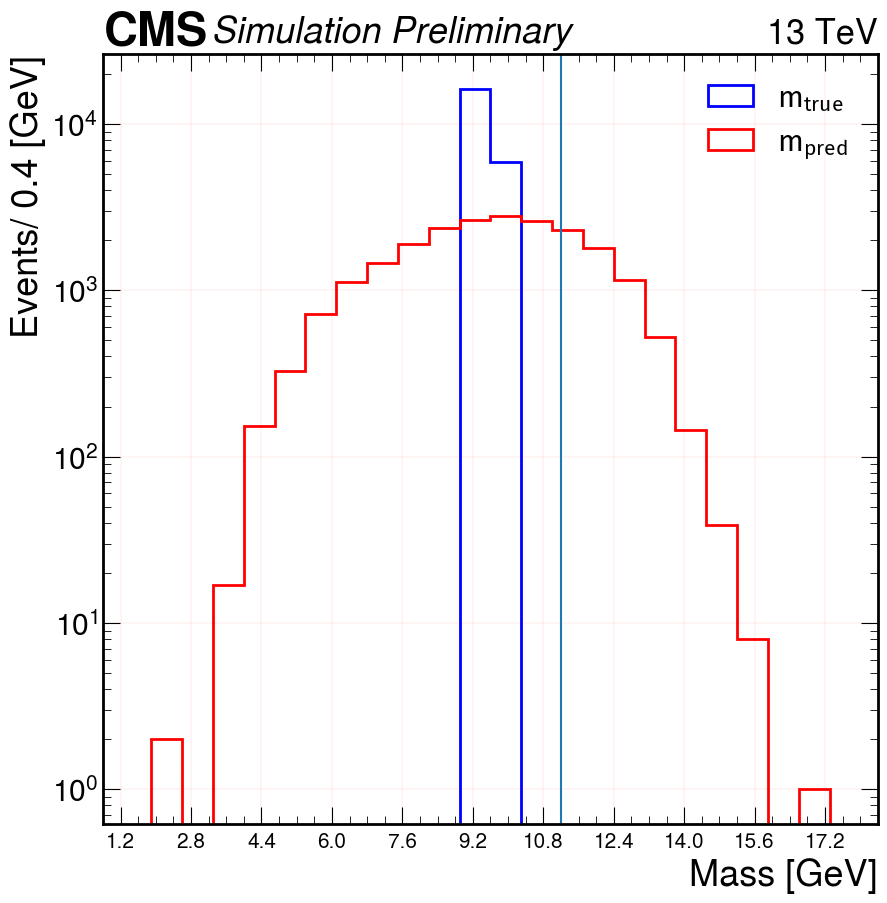

In [6]:
m_true, m_pred = [], []
for i in range(len(m_true_)):
    if m_true_[i]<9.3 or m_true_[i] >9.7 :continue
    m_true.append(m_true_[i])
    m_pred.append(m_pred_[i])
    
bin_size=.4
fig, ax = plt.subplots(figsize=(10,10))
plt.hist(np.squeeze(m_true), range=(1.2,18), bins=len(np.arange(9,18+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{true}}$', linestyle='-', color='blue', linewidth=2,log=1)
plt.hist(np.squeeze(m_pred), range=(1.2,18), bins=len(np.arange(9,18+0.4,bin_size)), histtype='step', label=r'$\mathrm{m_{pred}}$', linestyle='-', color='red', linewidth=2,log=1)
plt.xlim(1.2-bin_size,18+bin_size)
plt.xticks(np.arange(1.2,18+bin_size,1.6),size=15)
plt.grid(color='r', linestyle='--', linewidth=.1)
plt.xlabel('Mass [GeV]')
plt.ylabel('Events/ 0.4 [GeV]' )
plt.axvline(x=11.2)
# plt.title(r'$\mathrm{m_{true}}$, $\mathrm{m_{pred}}$ masses', size=25)
plt.legend(loc='upper right')
hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtru_mpred_hist_truncate.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()    

ZeroDivisionError: float division by zero

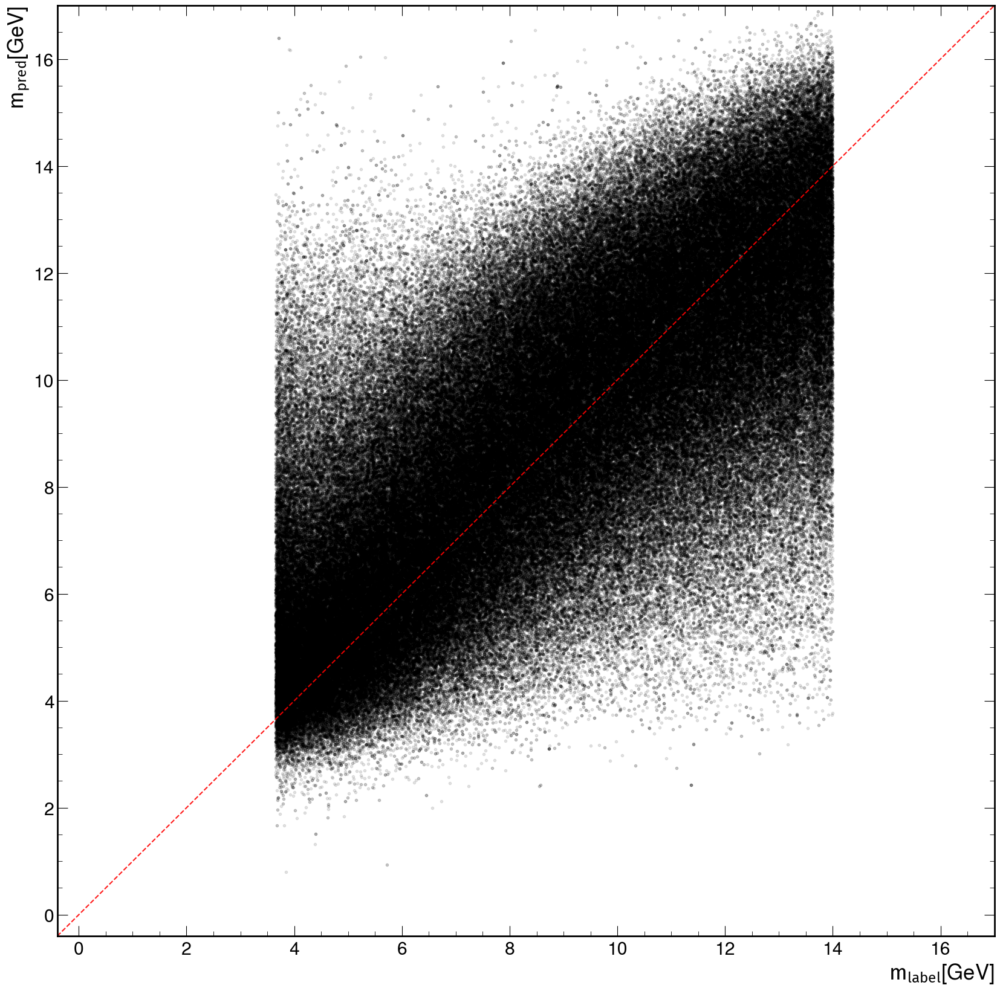

In [60]:
# Check scatter plots m_true v m_pred
# Extended version
fig, ax = plt.subplots(figsize=(20,20))
plt.plot(m_true_, m_pred_, ".", color='black', alpha=0.1, label='MAE = %.3f GeV'%np.mean(mae_))
plt.xlabel(r'$\mathrm{m_{label}} [GeV]$', size=25)
plt.ylabel(r'$\mathrm{m_{pred}} [GeV]$', size=25)
plt.plot((m0_min-1.2, m0_max+0.8), (m0_min-1.2, m0_max+0.8), color='r', linestyle='--', alpha=0.9)
plt.xlim(m0_min-1.2, m0_max+0.8)
plt.ylim(m0_min-1.2, m0_max+0.8)
plt.xticks(np.arange(m0_min-1.2,m0_max+0.8,0.),size=17)
plt.yticks(np.arange(m0_min-1.2,m0_max+0.8,0.4),size=17)
plt.grid(color='r', linestyle='--', linewidth=.1)
plt.legend(loc='upper left')
hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtrue_mpred_scatter_full.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
plt.show()


# # Truncated version
# fig, ax = plt.subplots(figsize=(20,20), dpi=150)
# plt.plot(m_true, m_pred_, ".", color='black', alpha=0.1, label='MAE = %.3f GeV'%np.mean(mae_))
# plt.xlabel(r'$\mathrm{m_{label}}$ [GeV]'  )
# plt.ylabel(r'$\mathrm{m_{pred}}$ [GeV]')
# plt.plot((m0_min, m0_max), (m0_min, m0_max), color='r', linestyle='--', alpha=0.9)
# plt.xlim(m0_min, m0_max)
# plt.ylim(m0_min, m0_max)
# plt.xticks(np.arange(m0_min,m0_max+0.4,0.4),size=17)
# plt.yticks(np.arange(m0_min,m0_max+0.4,0.4),size=17)
# plt.grid(color='r', linestyle='--', linewidth=.1)
# plt.legend(loc='upper left')
# hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# # plt.savefig('%s/%d_mtrue_mpred_scatter_truncate.png'%(out_dir, epoch), bbox_inches='tight',dpi=300, facecolor = "w")
# plt.show()


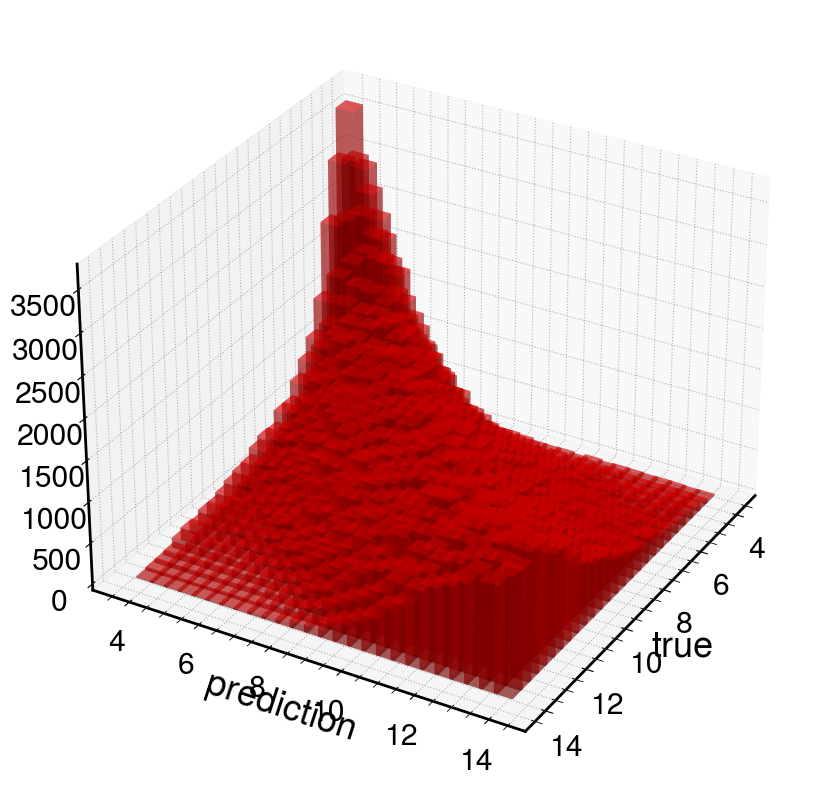

In [13]:
true, pred = [], []
for i in range(len(m_true_)):
    if m_pred_[i]>14 or m_pred_[i]<3.6:continue
    true.append(m_true_[i])
    pred.append(m_pred_[i])

# Generate random data
x = np.squeeze(true)
y = np.squeeze(pred)

# Create a 3D histogram
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

hist, xedges, yedges = np.histogram2d(x, y, bins=[np.arange(3.6, 14.1, .4), np.arange(3.6, 14.1, .4)])

# Convert the bin edges to centers
xpos, ypos = np.meshgrid(xedges[:-1] + 0.1, yedges[:-1] + 0.1)

xpos = xpos.flatten()
ypos = ypos.flatten()
zpos = np.zeros_like(xpos)

# Flatten the histogram
dx = dy = 0.5 * np.ones_like(zpos)
dz = hist.flatten()

# Plot the histogram
ax.bar3d(xpos, ypos, zpos, dx, dy, dz, color='r', alpha=0.4)


# Set labels and title
ax.set_xlabel('true')
ax.set_ylabel('prediction')
# ax.set_zlabel('Frequency')

# Rotate the plot interactively
ax.view_init(elev=30, azim=30)

# Show the plot
plt.show()


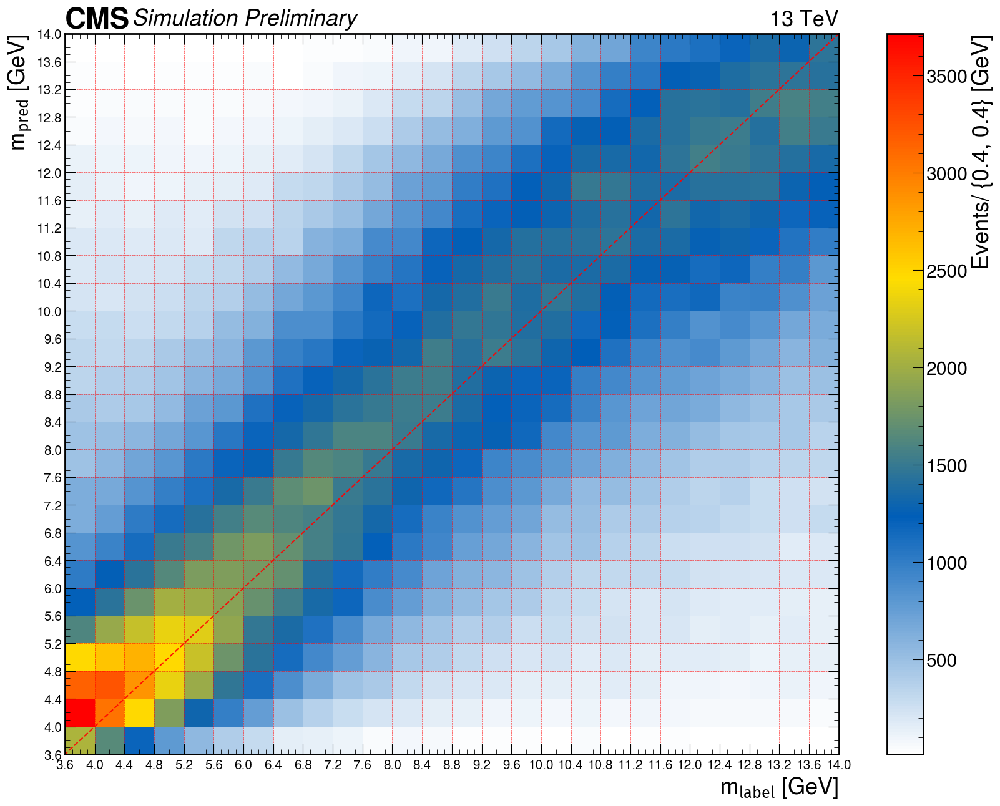

In [15]:
# Truncated version
fig, ax = plt.subplots(figsize=(20,15))
hist = plt.hist2d(x, y, bins=[np.arange(3.6, 14.1, .4), np.arange(3.6, 14.1, .4)],cmap=cms_cmap)
plt.xlabel(r'$\mathrm{m_{label}}$ [GeV]')
plt.ylabel(r'$\mathrm{m_{pred}}$ [GeV]')
plt.plot((m0_min, m0_max), (m0_min, m0_max), color='r', linestyle='--', alpha=0.9)
plt.xticks(np.arange(3.6, 14.1, .4),size=15)
plt.yticks(np.arange(3.6, 14.1, .4),size=15)
plt.colorbar().set_label(label='Events/ {0.4, 0.4} [GeV]')
plt.grid(color='r', linestyle='--', linewidth=.5)

hep.cms.label(llabel="Simulation Preliminary", rlabel="13 TeV", loc=0, ax=ax)
# plt.savefig('%s/%d_mtrue_mpred_2D_hist_truncated.png'%(out_dir, epoch),  bbox_inches='tight', dpi=300, facecolor = "w")
plt.show()

In [21]:
!ls -lhtr 



total 26M
-rw-r--r-- 1 bbbam users 21M Jul 18 16:40 epoch1_val_pseudoscalar_mae2.0676_inference_data.pkl


In [106]:
!pwd

/home/bbbam
